# 2020.06.08_baselinesagain
-----
Since I am a total fucking retard and I delete all important shit - I'm going to waste anotehr day regenerating this fucking shit

Recap of all models to date
*   basic online model with rolling window (no technical features)
*  disjoint returns
*   online learning with Q and P-omega weights
* boosting / sequential residualization


### Version Info
* madmax: `122d01b`, `13fea37`  `03d8dcf` `c27f2ef`
* research: `6d93bb9`, `3d47f5a` `80fb09a` `84be2cb` 


---
## History

#### 2020.06.04_recap
Recap of all models to date
*   basic online model with rolling window (no technical features)
*  disjoint returns
*   online learning with Q and P-omega weights
* boosting / sequential residualization



In [40]:
Y_t = tr.cat( [tr.randn( 20 ).unsqueeze(1), tr.linspace( 2, 3, 20 ).unsqueeze(1), tr.linspace( 2, -3, 20 ).unsqueeze(1) ], dim=1 )
lq, uq = 0.1, 0.9
lk = 1 + round( float( lq ) * (Y_t.shape[0] - 1) )
uk = 1 + round( float( uq ) * (Y_t.shape[0] - 1) )
lc = Y_t.kthvalue( lk, dim=0, keepdims=True )[0]
uc = Y_t.kthvalue( uk, dim=0, keepdims=True )[0]

In [8]:
# preamble
%alias_magic  nbagg matplotlib -p nbagg
%alias_magic  inline matplotlib -p inline
%load_ext memory_profiler
%load_ext line_profiler

from pylab import *
from madmax.api import *
mx = mx.reload()
mxtr = mxtr.reload()
plt.style.use('seaborn-whitegrid')

###################################################################
# Interactive configuration
# When running a config grid this will throw a FrozenException
# and the grid Config will be used
###################################################################
try:
    Config = mx.Configuration(
        name = 'etf_technical/2020.06.08_baselines_again/',
        mode = 'interactive',
        hps = mx.HPSet(
            start='20070101',
            end='20200501',
            INTS_PER_DAY = 13,                
        ),
        code = '2020.06.08_baselines_again.ipynb',
        tb_port=6006,
    )
    disp('Running interactive configuration ', h=2)
except mx.Configuration.FrozenException:
    if Config.mode != 'grid':
        raise RuntimeError('An unexpected configruation encountered')
    disp('Running a grid configuration ', h=2)

device = 'cuda'
dtype = tr.float32
Config.start()


# to run run a grid of hyperparameters ...
####################################
# # hyperparameters
# mx.Config.hps = fr.HPSet(
# )
# mx.Config.code = ''
# # configs = []
# # for obs_weight in ['no_weight', 'dollar_weight', 'log_weight']:
# #     cfg = fr.Config.clone()
# #     cf
# #     cfg.hps = cfg.hps.clone( obs_weight=obs_weight )
# #     cfg.freeze()
# #     display_html( cfg )
# #     configs.append( cfg )
# # notebook = fr.Config.run_grid( configs, outfile=fr.Config.uri+'/../cadre_price_index.20200302 - weight_grid_results.ipynb', n_jobs=None )

Created `%nbagg` as an alias for `%matplotlib nbagg`.
Created `%inline` as an alias for `%matplotlib inline`.
The memory_profiler extension is already loaded. To reload it, use:
  %reload_ext memory_profiler
The line_profiler extension is already loaded. To reload it, use:
  %reload_ext line_profiler


<h1> Config etf_technical/2020.06.08_baselines_again/ </h1>
<b> hash</b>: none </h4>
<b> mode </b>: interactive
<b> frozen </b>: False
<b> uri </b>: /home/fj/experiments/etf_technical/2020.06.08_baselines_again/none
<b> tb_port </b>: 6006
<h3> Hyperparameters </h3>
HPSet(
		INTS_PER_DAY=13,
		end='20200501',
		start='20070101',
	)<h3> Code </h3>
<b> format </b>: .ipynb
<b> code </b> : /local/cloud/code/research/etf_technical/2020.06.08_baselines_again.ipynb

## interactive global hyperparameters

In [9]:
# global  configruation
#######
if Config.mode == 'grid':
    raise Config.FrozenException( 'running grid configruation - skipping')

hps = Config.hps

hps.universe = mx.HPSet(
    start = '20100101',
    end='20200401',
    min_count=2000,
    min_dollar_vol=1e5
)


hps.feature_set = mx.HPSet(
    unadj_prices=[
        'open_unadj_30min', 'high_unadj_30min', 'low_unadj_30min', 'close_unadj_30min', 'mid_unadj_30min',
        'log_open_unadj_30min', 'log_close_unadj_30min',
    ],
    adj_prices=[
        'open_adj_30min', 'high_adj_30min', 'low_adj_30min', 'close_adj_30min',
        'mid_adj_30min', 'mid_adj_0D.12h.vwap', 'mid_adj_2D.12h.vwap', 'mid_adj_5D.vwap',
        'open_adj_0D.12h', 'high_adj_0D.12h', 'low_adj_0D.12h',
        'open_adj_2D.12h', 'high_adj_2D.12h', 'low_adj_2D.12h',
        'open_adj_5D', 'high_adj_5D', 'low_adj_5D',
    ],
    rel_prices=[
        'rel_price_260', 'rel_price_780', 'rel_price_3276',
    ],
    volumes=[
        'volume_unadj_30min', 'dollar_volume_unadj_30min', 'avg_dollar_volume',
    ],
    log_volumes=[
        'log10_dollar_volume_30min', 'log10_dollar_volume_30min_resid',
    ],
    rel_volume=[
        'rel_dollar_volume_260', 'rel_dollar_volume_780',
        'rel_dollar_volume_3276',
    ],
    calendar=[
        'timeofday', 'cos1_timeofday', 'cos2_timeofday', 'cos4_timeofday',
        'dayofweek', 'cos1_dayofweek', 'cos2_dayofweek',
        'weekofmonth', 'cos1_weekofmonth', 'cos2_weekofmonth',
        'monthofquarter', 'cos1_monthofquarter', 'cos2_monthofquarter',
        'quarterofyear', 'cos1_quarterofyear', 'cos2_quarterofyear',
    ],
    lagging=[
        'lagrtn_adj_30min', 'lagrtn_adj_1hr', 'lagrtn_adj_1day',
        'lagrtn_adj_30min_resid',
    ],
    mkt=[
        'mkt_lagrtn_30min',
        'mkt_lagrtn_30min_260.rw_sd', 'mkt_lagrtn_30min_780.rw_sd', 'mkt_lagrtn_30min_3276.rw_sd',
    ],
    vol=[
        'lagrtn_adj_30min_260.rw_sd', 'lagrtn_adj_30min_780.rw_sd', 'lagrtn_adj_30min_3276.rw_sd',
        'lagrtn_adj_30min_resid_260.rw_sd', 'lagrtn_adj_30min_resid_780.rw_sd', 'lagrtn_adj_30min_resid_3276.rw_sd',
    ],
    zscores=[
        'lagrtn_adj_30min_260.rw_zscore', 'lagrtn_adj_30min_780.rw_zscore', 'lagrtn_adj_30min_3276.rw_zscore',
        'lagrtn_adj_30min_resid_260.rw_zscore', 'lagrtn_adj_30min_resid_780.rw_zscore',
        'lagrtn_adj_30min_resid_3276.rw_zscore',
    ],
    betas=[
        'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_30min_2340.ew_beta',
        'lagrtn_adj_30min_3276.ew_beta', 'lagrtn_adj_30min_6500.ew_beta',
    ],
    afacs=[ 'bw_afac_30min', 'fw_afac_30min' ],
    technical=[
        'true_range_30min', 'true_range_0D.12h', 'true_range_2D.12h', 'true_range_5D',
        'direction_30min', 'direction_0D.12h', 'direction_2D.12h', 'direction_5D',
        'delta_rtn_30min', 'delta_rtn_0D.12h', 'delta_rtn_2D.12h', 'delta_rtn_5D',
        'ttp_high_adj_0D.12h', 'ttp_high_adj_2D.12h', 'ttp_high_adj_5D',
        'ttp_low_adj_0D.12h', 'ttp_low_adj_2D.12h', 'ttp_low_adj_5D',    
    ],    
)

hps.leading_rtns = [
    'leadrtn_adj_30min', 'leadrtn_adj_1hr', 'leadrtn_adj_1day',
    'mkt_leadrtn_30min', 'mkt_leadrtn_1day',
    'leadrtn_adj_30min_disjoint.1', 'leadrtn_adj_30min_disjoint.2', 'leadrtn_adj_30min_disjoint.3',
]

hps.weights = ['valid_30min', 'weight', ]
    
baselines = OrderedDict()

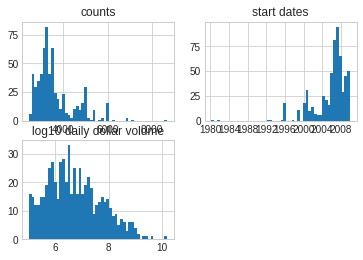

In [10]:
# identify the universe of ETFS
#############################################################
%inline
from research.etf_technical import etf_data_apr2020 as etfd; reload( etfd )

etf_stats = etfd.compute_etf_stats()
etf_stats = etf_stats[etf_stats.vendor=='kibot']
orig_len = len( etf_stats )
# drop etfs without enough history
etf_stats = etf_stats[(etf_stats['start'] <= hps.universe.start ) 
                      & (etf_stats['end'] > hps.universe.end ) 
                      & (etf_stats['n'] >= hps.universe.min_count)
                      & (etf_stats['daily_dollar_volume_adj'] >= hps.universe.min_dollar_vol ) ]

disp( 'after filtering', len( etf_stats ), 'symbols out of original ' ,orig_len )

etf_stats = (etf_stats
             .merge( etfd.all_etfs, how='left', left_on='symbol', right_on='Symbol' )
             .drop( columns=['Symbol', 'ETP Name', 'Leveraged / Inverse' ])
             .rename( columns={'Asset Class':'asset_class', 'Description':'name'} )
             .fillna( 'Not Specified')             
             .set_index('symbol')
            )
disp( etf_stats.groupby('asset_class').name.count() )

ax = subplot( 2,2, 1 )
etf_stats.n.hist(ax=ax, bins=50)
ax.set_title( 'counts')

ax = subplot( 2,2, 2 )
etf_stats.start.hist(ax=ax, bins=50)
ax.set_title( 'start dates')

ax = subplot( 2,2, 3 )
etf_stats.daily_dollar_volume_adj.log10().hist(ax=ax, bins=50)
ax.set_title( 'log10 daily dollar volume')

# this is the universe we will work with. 
# HERO has a massive returns spike in 2015.11.09 - which throws off residualization quite a bit.
hps.universe.symbols = sorted( etf_stats.index.values )


In [11]:
# build up the data and features
#############################################
%inline
from research.etf_technical import etf_data_apr2020 as etfd; reload( etfd )
from research.etf_technical import etf_technical_20200517 as etfrc; reload( etfrc )

# fetch the data as a dataarray
builder = etfd.BuildDataWithAfacs( symbols=hps.universe.symbols, mkt_only=True, start=hps.start ,).set( memoize=True )
builder.data = None
disp( 'builder BuildDataWithAfacs_7f79ef4bf  expected got', builder.hash() )
da = builder(  )
df = builder.output_meta

# hyperparams related to computing returns and residuals
hps.returns_hps = mx.HPSet(    
    price_windows=[ 24*1, 24*5, 24*10],
    beta_halflifes=[13 * 90, 13 * 180, 13 * 252, 13*500],
    dollar_volume_window=13*180,
    ema_halflifes=[20 * 13, 60 * 13, 252 * 13],
    resid_halflife=13,
    
)
# compute log-returns, log-dollar-volume, betas, residual returns and clean up the data
rtn_computer = etfrc.compute_returns_and_betas( 
    start=hps.start, end=None,     
    dollar_volume_window=hps.returns_hps.dollar_volume_window, 
    price_windows = hps.returns_hps.price_windows,
    beta_halflifes=hps.returns_hps.beta_halflifes, 
    resid_halflife=None,    
) 
rtn_computer.data = builder
disp( 'expected compute_returns_and_betas_9280a30dd got', rtn_computer.hash(), h=4, color='teal' )

# add relative price and relative volume features
rel_price_and_vols = etfrc.add_relative_price_and_volumes( emas=hps.returns_hps.ema_halflifes )
rel_price_and_vols.data = rtn_computer
disp( 'expected add_relative_price_and_volumes_a65da371a got', rel_price_and_vols.hash(), h=4, color='teal' )

# add volatility and calendar features
add_vols = etfrc.add_volatilities( emas=hps.returns_hps.ema_halflifes )
add_vols.data = rel_price_and_vols
disp( 'expected add_volatilities_77ca914f0 got', add_vols.hash(), h=4, color='teal' )

# add disjoint returns
disjoint_returns= etfrc.add_dijoint_returns( lags=(1, 2, 3) )
disjoint_returns.data = add_vols
disjoint_returns.features = 'leadrtn_adj_30min'
disp( 'expected add_dijoint_returns_ed1f196d1 got', disjoint_returns.hash(), h=4, color='teal' )
da = disjoint_returns(   )

# OnlineRunner_e7d983f5e
### The most basic baseline ( quadratic featues, no emas no omega weights )


In [ ]:
# OnlineRunner_e7d983f5e
##############
%inline

BASELINE_NAME = 'OnlineRunner_e7d983f5e'
BASELINE_NOTES = 'The most basic baseline ( quadratic featues, no emas no omega weights )'
make_baseline = True

disp( BASELINE_NAME, h=1 )
disp( BASELINE_NOTES, h=3 )    

from research.etf_technical import online_runner as reor; reload( reor )
data = disjoint_returns

online_hps = mx.HPSet(
    # stuff related to pre and post processing
    start=hps.start,
    end=hps.end, 
    symbol=None,
    winsorize_target=False, #winsorize returns
    winsorize_features=0.01, # winsorize features
    demean_features=False,
    normalize_features=False,
    regression_exposures=['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_30min'],
    regression_targets=['leadrtn_adj_30min', 'leadrtn_adj_30min_disjoint.1', 'leadrtn_adj_30min_disjoint.2'],
    # the feature sets
    features=sorted( set(
        []
        + ['open_unadj_30min', 'log_open_unadj_30min', 'lagrtn_adj_30min_resid', ]
        + hps.feature_set.lagging
        + hps.feature_set.vol
        + hps.feature_set.log_volumes
        # + hps.feature_set.calendar
        + hps.feature_set.mkt
        + hps.feature_set.betas
        # + hps.feature_set.technical
        # + hps.feature_set.afacs
    ) ),
    targets=(
        ['leadrtn_adj_30min']
        #+['leadrtn_adj_30min_disjoint.1', 'leadrtn_adj_30min_disjoint.2'],
    ),
    weight='valid_30min',
    # stuff related to online learning
    lookahead=2,
    ridge=1e-5,
    hl_1=None,
    hl_2=None,
    lr=500,
    kappa=5,  # util penalty
    tv=None,  # {1:1, 2:1, 13:1e-1},
    ortho=2,
    ortho_hl=13,
    # feautres to orthogonal out
    ortho_features=(
        []                
        + ['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day']  # tilt and mean revrsion        
        + hps.feature_set.betas # market
    ),
    algo='mbprox',
    batch_size=5000,    
    # stuff related to sid weighting
    use_omega=None,
    omega_lr=10,
    omega_ridge=0,
    omega_shift=0.1,    
    # the transformer
    transformer=mx.HPSet( pre_normalize=True, quadratic=True, post_normalize=True, ema_halflifes=None ) #[13 * 5, 13 * 20, 13 * 40], ),
)
disp( mx.tensorboard.start_server( 6008 ) )
disp( mx.tensorboard.start( clear=True ) )    
runner = reor.online_pipeline( data=data, online_hps=online_hps, memoize=True )
disp( f'Expected {BASELINE_NAME}  got ', runner.hash(), h=4, color='teal' )

# is this baselined  - then load from baseline cache
if BASELINE_NAME:
    # hash corruption somehwere - notify FJ
    if BASELINE_NAME != runner.hash():
        raise ValueError( f'baseline {name} does not match runner {runner.hash()} - make sure why this is the case ')
    baseline = mx.Baseline.load( BASELINE_NAME  )
    disp( 'loading ',  BASELINE_NAME, ' from baseline cache', h=3, color='orange' )        
    output_meta = baseline.output_meta
    output_features = baseline.output_features
# run the operator and 
else:
    runner.run()
    output_meta =  runner.output_meta
    output_features = runner.output_features
    # baseline this if needed
    if make_baseline:
        try:
            baseline = mx.Baseline.make( runner, hps=online_hps, notebook=mx.Config.code, notes=BASELINE_NOTES )
            disp( 'Baselined ', runner.hash(), h=4, color='teal' )
        except:
            disp( runner.hash(), 'already baselined - skipping', h=5, color='orange' )
    else:
        baseline = None

# --- show the results---
disp( online_hps )
for profile in output_meta['profiler']:
    main_fig = profile['main_fig']
    exp_fig = profile['exp_fig']
    reg_fig = profile['reg_fig'] 
    reg_df = profile['regressions']
    if not reg_df.empty: reg_df = reg_df.set_index( ['returns', 'lag'] )
    disp( profile['feature'],  h=3, hr=True )    
    disp( 'Regressions', reg_df, h=4 )
    disp( reg_fig  )
    disp( exp_fig )
result = output_meta['comparator']
disp( f'Comparison for {output_features }', h=1 )
disp( 'Static Forecast correlations', result['fcst_corrs'], h=2 )
disp( 'Static Orthog SRs', result['static_osrs'], h=2 )
disp( 'Static Orthog Pnl', result['static_opnl'], h=2 )
if 'roll_osrs' in result:
    disp( 'Rolling Orthog SRs', result['roll_osrs'], h=2 )
    disp( 'Rolling Orthog Pnl', result['roll_opnl'], h=2 )

# OnlineRunner_dacf3bfd0
### Primary baseline with quadratic features and emas ( no omega weights ), residualized for OnlineRunner_e7d983f5e


In [ ]:
# OnlineRunner_dacf3bfd0
##############
%inline
from research.etf_technical import online_runner as reor; reload( reor )

BASELINE_NAME = 'OnlineRunner_dacf3bfd0'
BASELINE_NOTES = 'Primary baseline with quadratic features and emas ( no omega weights ), residualized for OnlineRunner_e7d983f5e'
make_baseline = True

disp( BASELINE_NAME, h=1 )
disp( BASELINE_NOTES, h=3 )    

# load up a previous baseline as reference and rename its output features
ref_baseline = mx.Baseline.load( 'OnlineRunner_e7d983f5e' )
data = mx.RenameFeatures( 
    new_features=[f'{ft}_OnlineRunner_e7d983f5e' for ft in ref_baseline.output_features] 
).set( data=ref_baseline, features=ref_baseline.output_features )


online_hps = mx.HPSet(
    # stuff related to pre and post processing
    start=hps.start,
    end=hps.end, 
    symbol=None,
    winsorize_target=False, #winsorize returns
    winsorize_features=0.01, # winsorize features
    demean_features=False,
    normalize_features=False,
    regression_exposures=(
        ['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_30min'] 
        +['leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_e7d983f5e']
    ),
    regression_targets=['leadrtn_adj_30min', 'leadrtn_adj_30min_disjoint.1', 'leadrtn_adj_30min_disjoint.2'],
    # the feature sets
    features=sorted( set(
        []
        + ['open_unadj_30min', 'log_open_unadj_30min', 'lagrtn_adj_30min_resid', ]
        + hps.feature_set.lagging
        + hps.feature_set.vol
        + hps.feature_set.log_volumes
        # + hps.feature_set.calendar
        + hps.feature_set.mkt
        + hps.feature_set.betas
        # + hps.feature_set.technical
        # + hps.feature_set.afacs
    ) ),
    targets=(
        ['leadrtn_adj_30min'] 
        #+['leadrtn_adj_30min_disjoint.1', 'leadrtn_adj_30min_disjoint.2'],
    ),
    weight='valid_30min',
    # stuff related to online learning
    lookahead=2,
    ridge=1e-5,
    hl_1=None,
    hl_2=None,
    lr=500,
    kappa=2,  # util penalty
    tv=None,  # {1:1, 2:1, 13:1e-1},
    ortho=2,
    ortho_hl=13,
    # feautres to orthogonal out
    ortho_features=(
        []                
        + ['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day']  # tilt and mean revrsion        
        + hps.feature_set.betas # market
        # other baselines
        + ['leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_e7d983f5e',  ] 
    ),
    algo='mbprox',
    batch_size=5000,    
    # stuff related to sid weighting
    use_omega=None,
    omega_lr=10,
    omega_ridge=0,
    omega_shift=0.1,    
    # the transformer
    transformer=mx.HPSet( pre_normalize=True, quadratic=True, post_normalize=True, ema_halflifes=[13 * 5, 13 * 20, 13 * 40], ),
)
disp( mx.tensorboard.start_server( 6008 ) )
disp( mx.tensorboard.start( clear=True ) )    
runner = reor.online_pipeline( data=data, online_hps=online_hps, memoize=True )
disp( f'Expected {BASELINE_NAME}  got ', runner.hash(), h=4, color='teal' )

# is this baselined  - then load from baseline cache
if BASELINE_NAME:
    # hash corruption somehwere - notify FJ
    if BASELINE_NAME != runner.hash():
        raise ValueError( f'baseline {name} does not match runner {runner.hash()} - make sure why this is the case ')
    baseline = mx.Baseline.load( BASELINE_NAME  )
    disp( 'loading ',  BASELINE_NAME, ' from baseline cache', h=3, color='orange' )        
    output_meta = baseline.output_meta
    output_features = baseline.output_features
# run the operator and 
else:
    runner.run()
    output_meta =  runner.output_meta
    output_features = runner.output_features
    # baseline this if needed
    if make_baseline:
        try:
            baseline = mx.Baseline.make( runner, hps=online_hps, notebook=mx.Config.code, notes=BASELINE_NOTES )
            disp( 'Baselined ', runner.hash(), h=4, color='teal' )
        except:
            disp( runner.hash(), 'already baselined - skipping', h=5, color='orange' )
    else:
        baseline = None

# --- show the results---
disp( online_hps )
for profile in output_meta['profiler']:
    main_fig = profile['main_fig']
    exp_fig = profile['exp_fig']
    reg_fig = profile['reg_fig'] 
    reg_df = profile['regressions']
    if not reg_df.empty: reg_df = reg_df.set_index( ['returns', 'lag'] )
    disp( profile['feature'],  h=3, hr=True )    
    disp( 'Regressions', reg_df, h=4 )
    disp( reg_fig  )
    disp( exp_fig )
result = output_meta['comparator']
disp( f'Comparison for {output_features }', h=1 )
disp( 'Static Forecast correlations', result['fcst_corrs'], h=2 )
disp( 'Static Orthog SRs', result['static_osrs'], h=2 )
disp( 'Static Orthog Pnl', result['static_opnl'], h=2 )
if 'roll_osrs' in result:
    disp( 'Rolling Orthog SRs', result['roll_osrs'], h=2 )
    disp( 'Rolling Orthog Pnl', result['roll_opnl'], h=2 )

#### compare against other baselines ####
A = baseline    
comparator = mx.ForecastComparator( targets=online_hps.regression_targets, weight=online_hps.weight, winlen=100*13 )
B = ref_baseline
disp( 'Comparing A=', A.name, A.notes, '\n\t with B=', B.name , B.notes, h=3 )
comparator.compare( A,  B, A_features=A.output_features[-1],  B_features=[B.output_features[-1]] )   


# OnlineRunner_d5cf610a7
### Primary baseline with quadratic features and emas, more kappa ( no omega weights ), residualized for OnlineRunner_e7d983f5e


In [ ]:
# OnlineRunner_d5cf610a7
##############
%inline
from research.etf_technical import online_runner as reor; reload( reor )

BASELINE_NAME = 'OnlineRunner_d5cf610a7'
BASELINE_NOTES = 'Primary baseline with quadratic features and emas, more kappa ( no omega weights ), residualized for OnlineRunner_e7d983f5e'
make_baseline = True

disp( BASELINE_NAME, h=1 )
disp( BASELINE_NOTES, h=3 )    

# load up a previous baseline as reference and rename its output features
ref_baseline = mx.Baseline.load( 'OnlineRunner_e7d983f5e' )
data = mx.RenameFeatures( 
    new_features=[f'{ft}_OnlineRunner_e7d983f5e' for ft in ref_baseline.output_features] 
).set( data=ref_baseline, features=ref_baseline.output_features )


online_hps = mx.HPSet(
    # stuff related to pre and post processing
    start=hps.start,
    end=hps.end, 
    symbol=None,
    winsorize_target=False, #winsorize returns
    winsorize_features=0.01, # winsorize features
    demean_features=False,
    normalize_features=False,
    regression_exposures=(
        ['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_30min'] 
        +['leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_e7d983f5e']
    ),
    regression_targets=['leadrtn_adj_30min', 'leadrtn_adj_30min_disjoint.1', 'leadrtn_adj_30min_disjoint.2'],
    # the feature sets
    features=sorted( set(
        []
        + ['open_unadj_30min', 'log_open_unadj_30min', 'lagrtn_adj_30min_resid', ]
        + hps.feature_set.lagging
        + hps.feature_set.vol
        + hps.feature_set.log_volumes
        # + hps.feature_set.calendar
        + hps.feature_set.mkt
        + hps.feature_set.betas
        # + hps.feature_set.technical
        # + hps.feature_set.afacs
    ) ),
    targets=(
        ['leadrtn_adj_30min'] 
        #+['leadrtn_adj_30min_disjoint.1', 'leadrtn_adj_30min_disjoint.2'],
    ),
    weight='valid_30min',
    # stuff related to online learning
    lookahead=2,
    ridge=1e-5,
    hl_1=None,
    hl_2=None,
    lr=500,
    kappa=10,  # util penalty
    tv=None,  # {1:1, 2:1, 13:1e-1},
    ortho=2,
    ortho_hl=13,
    # feautres to orthogonal out
    ortho_features=(
        []                
        + ['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day']  # tilt and mean revrsion        
        + hps.feature_set.betas # market
        # other baselines
        + ['leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_e7d983f5e',  ] 
    ),
    algo='mbprox',
    batch_size=5000,    
    # stuff related to sid weighting
    use_omega=None,
    omega_lr=10,
    omega_ridge=0,
    omega_shift=0.1,    
    # the transformer
    transformer=mx.HPSet( pre_normalize=True, quadratic=True, post_normalize=True, ema_halflifes=[13 * 5, 13 * 20, 13 * 40], ),
)
disp( mx.tensorboard.start_server( 6008 ) )
disp( mx.tensorboard.start( clear=True ) )    
runner = reor.online_pipeline( data=data, online_hps=online_hps, memoize=True )
disp( f'Expected {BASELINE_NAME}  got ', runner.hash(), h=4, color='teal' )

# is this baselined  - then load from baseline cache
if BASELINE_NAME:
    # hash corruption somehwere - notify FJ
    if BASELINE_NAME != runner.hash():
        raise ValueError( f'baseline {name} does not match runner {runner.hash()} - make sure why this is the case ')
    baseline = mx.Baseline.load( BASELINE_NAME  )
    disp( 'loading ',  BASELINE_NAME, ' from baseline cache', h=3, color='orange' )        
    output_meta = baseline.output_meta
    output_features = baseline.output_features
# run the operator and 
else:
    runner.run()
    output_meta =  runner.output_meta
    output_features = runner.output_features
    # baseline this if needed
    if make_baseline:
        try:
            baseline = mx.Baseline.make( runner, hps=online_hps, notebook=mx.Config.code, notes=BASELINE_NOTES )
            disp( 'Baselined ', runner.hash(), h=4, color='teal' )
        except:
            disp( runner.hash(), 'already baselined - skipping', h=5, color='orange' )
    else:
        baseline = None

# --- show the results---
disp( online_hps )
for profile in output_meta['profiler']:
    main_fig = profile['main_fig']
    exp_fig = profile['exp_fig']
    reg_fig = profile['reg_fig'] 
    reg_df = profile['regressions']
    if not reg_df.empty: reg_df = reg_df.set_index( ['returns', 'lag'] )
    disp( profile['feature'],  h=3, hr=True )    
    disp( 'Regressions', reg_df, h=4 )
    disp( reg_fig  )
    disp( exp_fig )
result = output_meta['comparator']
disp( f'Comparison for {output_features }', h=1 )
disp( 'Static Forecast correlations', result['fcst_corrs'], h=2 )
disp( 'Static Orthog SRs', result['static_osrs'], h=2 )
disp( 'Static Orthog Pnl', result['static_opnl'], h=2 )
if 'roll_osrs' in result:
    disp( 'Rolling Orthog SRs', result['roll_osrs'], h=2 )
    disp( 'Rolling Orthog Pnl', result['roll_opnl'], h=2 )

#### compare against other baselines ####
A = baseline    
comparator = mx.ForecastComparator( targets=online_hps.regression_targets, weight=online_hps.weight, winlen=100*13 )
B = ref_baseline
disp( 'Comparing A=', A.name, A.notes, '\n\t with B=', B.name , B.notes, h=3 )
comparator.compare( A,  B, A_features=A.output_features[-1],  B_features=[B.output_features[-1]] )   


# OnlineRunner_cdc0aaa37
### Primary baseline with quadratic features and emas, more kappa ( no omega weights ), using OnlineRunner_e7d983f5e as a feature and ortho_feature


In [ ]:
# OnlineRunner_cdc0aaa37
##############
%inline
from research.etf_technical import online_runner as reor; reload( reor )

BASELINE_NAME = 'OnlineRunner_cdc0aaa37'
BASELINE_NOTES = 'Primary baseline with quadratic features and emas, more kappa ( no omega weights ), using OnlineRunner_e7d983f5e as a feature and ortho_feature'
make_baseline = True

disp( BASELINE_NAME, h=1 )
disp( BASELINE_NOTES, h=3 )    

# load up a previous baseline as reference and rename its output features
ref_baseline = mx.Baseline.load( 'OnlineRunner_e7d983f5e' )
data = mx.RenameFeatures( 
    new_features=[f'{ft}_OnlineRunner_e7d983f5e' for ft in ref_baseline.output_features] 
).set( data=ref_baseline, features=ref_baseline.output_features )


online_hps = mx.HPSet(
    # stuff related to pre and post processing
    start=hps.start,
    end=hps.end, 
    symbol=None,
    winsorize_target=False, #winsorize returns
    winsorize_features=0.01, # winsorize features
    demean_features=False,
    normalize_features=False,
    regression_exposures=(
        ['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_30min'] 
        +['leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_e7d983f5e']
    ),
    regression_targets=['leadrtn_adj_30min', 'leadrtn_adj_30min_disjoint.1', 'leadrtn_adj_30min_disjoint.2'],
    # the feature sets
    features=sorted( set(
        []
        + ['open_unadj_30min', 'log_open_unadj_30min', 'lagrtn_adj_30min_resid', ]
        + hps.feature_set.lagging
        + hps.feature_set.vol
        + hps.feature_set.log_volumes
        # + hps.feature_set.calendar
        + hps.feature_set.mkt
        + hps.feature_set.betas
        # + hps.feature_set.technical
        # + hps.feature_set.afacs
        # other baselines as features
        + ['leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_e7d983f5e',  ]         
    ) ),
    targets=(
        ['leadrtn_adj_30min'] 
        #+['leadrtn_adj_30min_disjoint.1', 'leadrtn_adj_30min_disjoint.2'],
    ),
    weight='valid_30min',
    # stuff related to online learning
    lookahead=2,
    ridge=1e-5,
    hl_1=None,
    hl_2=None,
    lr=500,
    kappa=10,  # util penalty
    tv=None,  # {1:1, 2:1, 13:1e-1},
    ortho=2,
    ortho_hl=13,
    # feautres to orthogonal out
    ortho_features=(
        []                
        + ['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day']  # tilt and mean revrsion        
        + hps.feature_set.betas # market
        # other baselines
        + ['leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_e7d983f5e',  ] 
    ),
    algo='mbprox',
    batch_size=5000,    
    # stuff related to sid weighting
    use_omega=None,
    omega_lr=10,
    omega_ridge=0,
    omega_shift=0.1,    
    # the transformer
    transformer=mx.HPSet( pre_normalize=True, quadratic=True, post_normalize=True, ema_halflifes=[13 * 5, 13 * 20, 13 * 40], ),
)
disp( mx.tensorboard.start_server( 6008 ) )
disp( mx.tensorboard.start( clear=True ) )    
runner = reor.online_pipeline( data=data, online_hps=online_hps, memoize=True )
disp( f'Expected {BASELINE_NAME}  got ', runner.hash(), h=4, color='teal' )

# is this baselined  - then load from baseline cache
if BASELINE_NAME:
    # hash corruption somehwere - notify FJ
#     if BASELINE_NAME != runner.hash():
#         raise ValueError( f'baseline {BASELINE_NAME} does not match runner {runner.hash()} - make sure why this is the case ')
    baseline = mx.Baseline.load( BASELINE_NAME  )
    disp( 'loading ',  BASELINE_NAME, ' from baseline cache', h=3, color='orange' )        
    output_meta = baseline.output_meta
    output_features = baseline.output_features
# run the operator and 
else:
    runner.run()
    output_meta =  runner.output_meta
    output_features = runner.output_features
    # baseline this if needed
    if make_baseline:
        try:
            baseline = mx.Baseline.make( runner, hps=online_hps, notebook=mx.Config.code, notes=BASELINE_NOTES )
            disp( 'Baselined ', runner.hash(), h=4, color='teal' )
        except:
            disp( runner.hash(), 'already baselined - skipping', h=5, color='orange' )
    else:
        baseline = None

# --- show the results---
disp( online_hps )
for profile in output_meta['profiler']:
    main_fig = profile['main_fig']
    exp_fig = profile['exp_fig']
    reg_fig = profile['reg_fig'] 
    reg_df = profile['regressions']
    if not reg_df.empty: reg_df = reg_df.set_index( ['returns', 'lag'] )
    disp( profile['feature'],  h=3, hr=True )    
    disp( 'Regressions', reg_df, h=4 )
    disp( reg_fig  )
    disp( exp_fig )
result = output_meta['comparator']
disp( f'Comparison for {output_features }', h=1 )
disp( 'Static Forecast correlations', result['fcst_corrs'], h=2 )
disp( 'Static Orthog SRs', result['static_osrs'], h=2 )
disp( 'Static Orthog Pnl', result['static_opnl'], h=2 )
if 'roll_osrs' in result:
    disp( 'Rolling Orthog SRs', result['roll_osrs'], h=2 )
    disp( 'Rolling Orthog Pnl', result['roll_opnl'], h=2 )

#### compare against other baselines ####
A = baseline    
comparator = mx.ForecastComparator( targets=online_hps.regression_targets, weight=online_hps.weight, winlen=100*13 )
B = ref_baseline
disp( 'Comparing A=', A.name, A.notes, '\n\t with B=', B.name , B.notes, h=3 )
comparator.compare( A,  B, A_features=A.output_features[-1],  B_features=[B.output_features[-1]] )   

A = baseline    
comparator = mx.ForecastComparator( targets=online_hps.regression_targets, weight=online_hps.weight, winlen=100*13 )
B = mx.Baseline.load( 'OnlineRunner_dacf3bfd0' )
disp( 'Comparing A=', A.name, A.notes, '\n\t with B=', B.name , B.notes, h=3 )
comparator.compare( A,  B, A_features=A.output_features[-1],  B_features=B.output_features[-1] )   




# OnlineRunner_eed1a978d
## Q-omega weights residualized for OnlineRunner_cdc0aaa37 and OnlineRunner_e7d983f5e (as features and ortho_features)

In [ ]:
# OnlineRunner_eed1a978d
##############
%inline
from research.etf_technical import online_runner as reor; reload( reor )

BASELINE_NAME = 'OnlineRunner_eed1a978d'
BASELINE_NOTES = 'Q-omega weights residualized for OnlineRunner_cdc0aaa37 and OnlineRunner_e7d983f5e (as features and ortho_features)'
make_baseline = True

disp( BASELINE_NAME, h=1 )
disp( BASELINE_NOTES, h=3 )    

# load up a previous baseline as reference and rename its output features
ref_baseline = mx.Baseline.load( 'OnlineRunner_cdc0aaa37' )
data = mx.RenameFeatures( 
    new_features=[f'{ft}_OnlineRunner_cdc0aaa37' for ft in ref_baseline.output_features] 
).set( data=ref_baseline, features=ref_baseline.output_features )

online_hps = mx.HPSet(
    # stuff related to pre and post processing
    start=hps.start, #'20100101', #
    end=hps.end,  #'20120101', #
    symbol=None,
    winsorize_target=False, #winsorize returns
    winsorize_features=0.01, # winsorize features
    demean_features=False,
    normalize_features=False,
    regression_exposures=(
        ['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_30min'] 
        +['leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_e7d983f5e',
         'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_cdc0aaa37']
    ),
    regression_targets=['leadrtn_adj_30min', 'leadrtn_adj_30min_disjoint.1', 'leadrtn_adj_30min_disjoint.2'],
    # the feature sets
    features=sorted( set(
        []
        + ['open_unadj_30min', 'log_open_unadj_30min', 'lagrtn_adj_30min_resid', ]
        + hps.feature_set.lagging
        + hps.feature_set.vol
        + hps.feature_set.log_volumes
        # + hps.feature_set.calendar
        + hps.feature_set.mkt
        + hps.feature_set.betas
        # + hps.feature_set.technical
        # + hps.feature_set.afacs
        # other baselines as features
        + ['leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_e7d983f5e', 'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_cdc0aaa37']
    ) ),
    targets=(
        ['leadrtn_adj_30min'] 
        #+['leadrtn_adj_30min_disjoint.1', 'leadrtn_adj_30min_disjoint.2'],
    ),
    weight='valid_30min',
    # stuff related to online learning
    lookahead=2,
    ridge=1e-5,
    hl_1=None,
    hl_2=None,
    lr=500,
    kappa=10,  # util penalty
    tv=None,  # {1:1, 2:1, 13:1e-1},
    ortho=2,
    ortho_hl=13,
    # feautres to orthogonal out
    ortho_features=(
        []                
        + ['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day']  # tilt and mean revrsion        
        + hps.feature_set.betas # market
        # other baselines
        + ['leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_e7d983f5e', 'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_cdc0aaa37']
    ),
    algo='mbprox',
    batch_size=5000,    
    # stuff related to sid weighting
    use_omega='Q',
    omega_lr=10,
    omega_ridge=0,
    omega_shift=0.1,    
    # the transformer
    transformer=mx.HPSet( pre_normalize=True, quadratic=True, post_normalize=True, ema_halflifes=[13 * 5, 13 * 20, 13 * 40], ),
)
# checkpoints borked
if False:
    disp( mx.tensorboard.start_server( ) )
    disp( mx.tensorboard.start( clear=True ) )    
    runner = reor.online_pipeline( data=data, online_hps=online_hps, memoize=True )
    disp( f'Expected {BASELINE_NAME}  got ', runner.hash(), h=4, color='teal' )

# is this baselined  - then load from baseline cache
if BASELINE_NAME:
    # hash corruption somehwere - notify FJ
    if BASELINE_NAME != runner.hash():
        raise ValueError( f'baseline {BASELINE_NAME} does not match runner {runner.hash()} - make sure why this is the case ')
    baseline = mx.Baseline.load( BASELINE_NAME  )
    disp( 'loading ',  BASELINE_NAME, ' from baseline cache', h=3, color='orange' )        
    output_meta = baseline.output_meta
    output_features = baseline.output_features
# run the operator and 
else:
    runner.run()
    output_meta =  runner.output_meta
    output_features = runner.output_features
    # baseline this if needed
    if make_baseline:
        try:
            baseline = mx.Baseline.make( runner, hps=online_hps, notebook=Config.code, notes=BASELINE_NOTES )
            disp( 'Baselined ', runner.hash(), h=4, color='teal' )
        except:
            disp( runner.hash(), 'already baselined - skipping', h=5, color='orange' )
    else:
        baseline = runner

# --- show the results---
disp( online_hps )
for profile in output_meta['profiler']:
    main_fig = profile['main_fig']
    exp_fig = profile['exp_fig']
    reg_fig = profile['reg_fig'] 
    reg_df = profile['regressions']
    if not reg_df.empty: reg_df = reg_df.set_index( ['returns', 'lag'] )
    disp( profile['feature'],  h=3, hr=True )    
    disp( 'Regressions', reg_df, h=4 )
    disp( reg_fig  )
    disp( exp_fig )
result = output_meta['comparator']
disp( f'Comparison for {output_features }', h=1 )
disp( 'Static Forecast correlations', result['fcst_corrs'], h=2 )
disp( 'Static Orthog SRs', result['static_osrs'], h=2 )
disp( 'Static Orthog Pnl', result['static_opnl'], h=2 )
if 'roll_osrs' in result:
    disp( 'Rolling Orthog SRs', result['roll_osrs'], h=2 )
    disp( 'Rolling Orthog Pnl', result['roll_opnl'], h=2 )

    

# BaselineEnsemble_2020.06.09
## Consolidate all the baselines as of 2020.06.09 into one giant dataset and ensemble them

### Contains:
* OnlineRunner_e7d983f5e
* OnlineRunner_d5cf610a7
* OnlineRunner_f5b754d37
* OnlineRunner_cdc0aaa37
* OnlineRunner_eed1a978d
* OnlineRunner_ac791de12
* OnlineRunner_73844bf6b
* OnlineRunner_17e75d09f
* OnlineRunner_6c9fbc725
* OnlineRunner_0a8924518
* OnlineRunner_854f955c7
* OnlineRunner_dacf3bfd0

In [ ]:
# BaselineEnsemble_2020.06.09

from madmax.operators import comparator  as mxc; reload( mxc )

BASELINE_NAME = 'BaselineEnsemble_2020.06.09'
BASELINE_NOTES = 'Consolidate all the baselines as of 2020.06.09 into one giant dataset and ensemble them'
make_baseline = True

baselines = ['OnlineRunner_d5cf610a7', 'OnlineRunner_f5b754d37', 'OnlineRunner_eed1a978d', 'OnlineRunner_854f955c7', 'OnlineRunner_dacf3bfd0', 
             'OnlineRunner_cdc0aaa37',  'EnsembleForecasts_f4d5d4527', 'OnlineRunner_e7d983f5e']

@mx.operatorize( consumes_features=False, produces_meta=True  )
def MergeBaselines( data, baselines, targets, weight='valid_30min' ):
    '''merge a bunch of baselines together and save it to the baseline ache'''
    output_data = None
    baseline_forecasts = []
    all_forecasts = []
    for baseline_name in baselines:
        baseline = mx.Baseline.load( baseline_name )
        data = baseline( )
        # Find the forecast in this dataset and rename them together
        data = data.drop_mx( ['leadrtn_adj_30min_hat_xs_winsorize', 'leadrtn_adj_30min_hat_xs_zscore', 
                              '/leadrtn_adj_30min_hat_xs_winsorize_Online.*/', '/leadrtn_adj_30min_hat_xs_zscore_Online.*/' ])
        forecasts = data.find_mx( '/leadrtn_adj_30min_hat.*/' ) 
        unclobbered = mx.Features( '/.*OnlineRunner.*/').find( forecasts )
        clobbered = [fcst for fcst in forecasts if fcst not in unclobbered]
        if clobbered:
            logger.warn( f'renaming {clobbered} in {baseline.name}')
            data = data.rename_coords( features={fcst: f'{fcst}_{baseline.name}' for fcst in clobbered} )
            unclobbered += [f'{fcst}_{baseline.name}' for fcst in clobbered]
        all_forecasts += unclobbered
        if output_data is None:
            output_data = data
            output_features = data.features.values.tolist()
        else:
            # keep only the unique features from each dataarray
            keep_features = [ft for ft in data.coords['features'].values if ft not in output_features]        
            data = data.loc[:,:,keep_features]
            output_data  = xa.concat( [output_data, data], dim='features' )
            output_features += keep_features
    output_data = mx.compactify( output_data )
    # run the comparator on this
    rename_map = { fcst: f'fcst_{i}' for i, fcst in enumerate( mx.Features('/leadrtn_adj_30min_hat_xs_winsorize_xs_zscore.*/').find( output_data ) ) } 
    comparator = mxc.ForecastComparator( targets=targets, weight=weight, winlen=None )
    comparator.data = output_data.rename_coords( features=rename_map )
    comparator.features = sorted( rename_map.values() )
    comparator.run()
    output_meta = dict( comparator=comparator.output_meta, rename_map=pd.DataFrame( rename_map.values(), rename_map.keys() ))
    return output_data, all_forecasts, output_meta


    
# is this baselined  - then load from baseline cache
baseline = None
if BASELINE_NAME:
    try:
        baseline = mx.Baseline.load( BASELINE_NAME )        
        disp( 'loaded ',  BASELINE_NAME, ' from baseline cache', h=3, color='orange' )        
        output_meta = baseline.output_meta
        output_features = baseline.output_features
    except Exception as e:
        disp( 'did not find ', BASELINE_NAME, 'in baseline cache because ', e, '\n  running', h=3, color='purple' )
        
# run the runner if needed
if baseline is None:
    runner = MergeBaselines(
    baselines, targets=['leadrtn_adj_30min', 'leadrtn_adj_30min_disjoint.1', 'leadrtn_adj_30min_disjoint.2'] 
    ).set( data=None, memoize=True )
    runner.run()
    output_meta =  runner.output_meta
    output_features = runner.output_features
    # baseline this if needed
    if make_baseline:
        baseline = mx.Baseline.make( runner, hps=baselines, notebook=Config.code,  notes=BASELINE_NOTES, name=BASELINE_NAME  )
        disp( 'Baselined ', runner.hash(), h=4, color='teal' )
    else:
        baseline = runner

# --- show the results---
for profile in output_meta.get('profiler', []):
    main_fig = profile['main_fig']
    exp_fig = profile['exp_fig']
    reg_fig = profile['reg_fig'] 
    reg_df = profile['regressions']
    if not reg_df.empty: reg_df = reg_df.set_index( ['returns', 'lag'] )
    disp( profile['feature'],  h=3, hr=True )    
    disp( 'Regressions', reg_df, h=4 )
    disp( reg_fig  )
    disp( exp_fig )
comparator = output_meta['comparator']
if comparator:
    rename_map = output_meta.get( 'rename_map', output_features )
    disp( f'Comparison for ', rename_map, h=1 )
    disp( 'Static Forecast correlations', comparison['fcst_corrs'], h=2 )
    disp( 'Static Orthog SRs', comparison['static_osrs'], h=2 )
    disp( 'Static Orthog Pnl', comparison['static_opnl'], h=2 )
    if 'roll_osrs' in output_meta:
        disp( 'Rolling Orthog SRs', comparison['roll_osrs'], h=2 )
        disp( 'Rolling Orthog Pnl', comparison['roll_opnl'], h=2 )
    

# OnlineRunner_9fcf514b3
## run the online learner on BaselineEnsemble_2020.06.09 using the individual models as features

,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,22984992,0.866510,-0.392866,0.895619,0.013056,0.000170,57.777515,3.637054,0.547485,0.526543,0.469906
leadrtn_adj_30min_disjoint.1,NaN,22984992,0.866484,-0.392866,0.190026,-0.001381,0.000002,-6.662162,-0.600667,0.547485,0.526543,0.469906
leadrtn_adj_30min_disjoint.2,NaN,22984992,0.866460,-0.392866,0.199985,0.009050,0.000082,38.843040,2.607219,0.547485,0.526543,0.469906


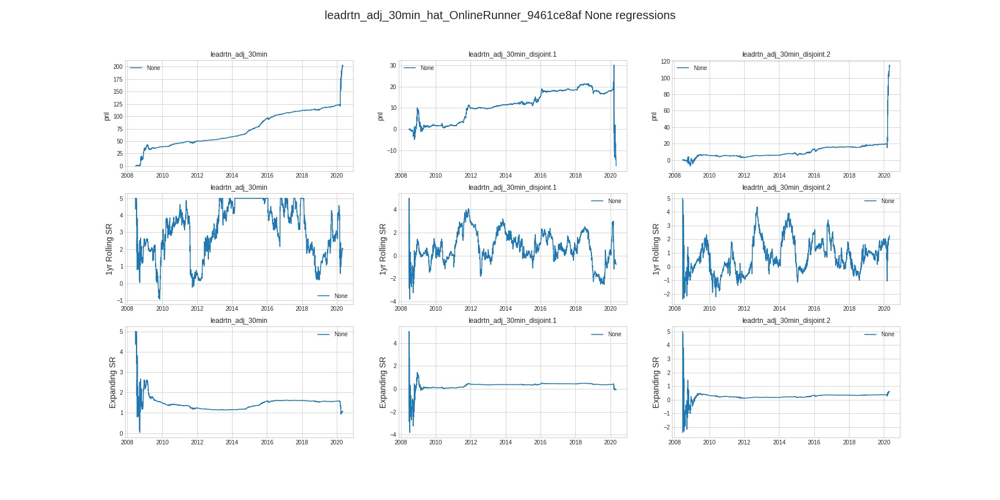

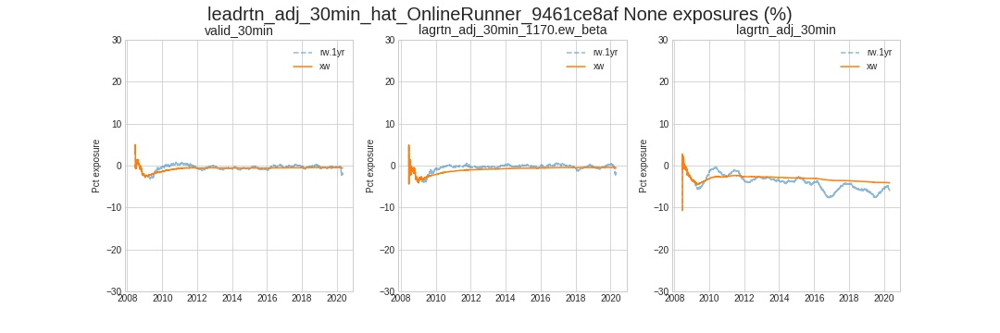

,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,22984992,0.866510,-7.699245e-11,1.198786,0.008315,0.000069,36.256134,9.029786,0.675813,0.644419,0.617893
leadrtn_adj_30min_disjoint.1,NaN,22984992,0.866484,-7.699245e-11,0.208898,0.001525,0.000002,5.484712,2.175649,0.675813,0.644419,0.617893
leadrtn_adj_30min_disjoint.2,NaN,22984992,0.866460,-7.699245e-11,0.170683,0.002072,0.000004,8.523304,2.826489,0.675813,0.644419,0.617893


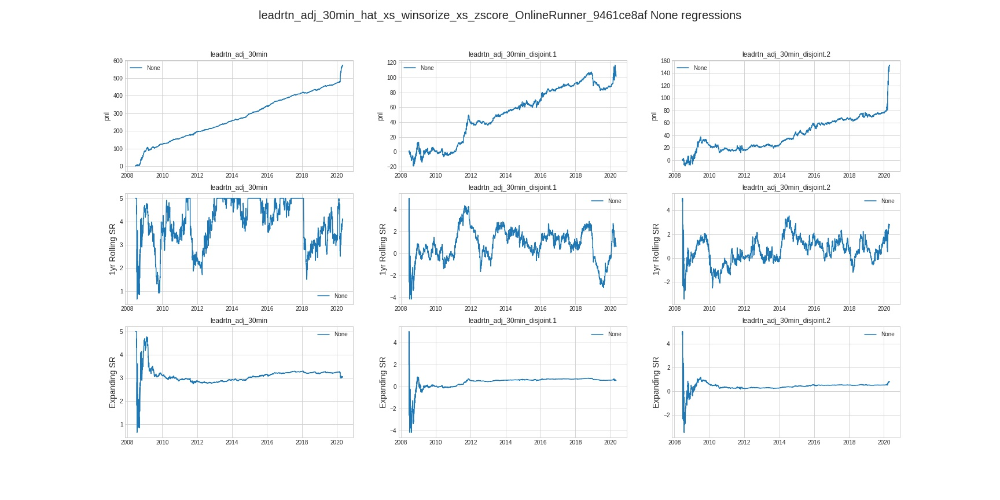

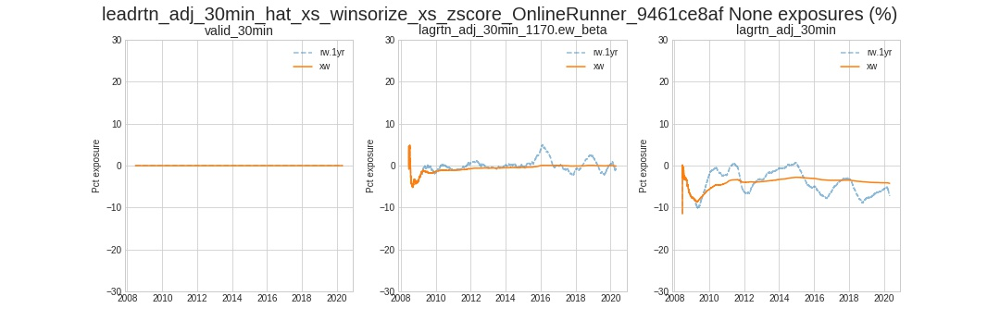

,0
leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_e7d983f5e,fcst_0
leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_d5cf610a7,fcst_1
leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_73844bf6b,fcst_2
leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_ac791de12,fcst_3
leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_17e75d09f,fcst_4
leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_6c9fbc725,fcst_5
leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_0a8924518,fcst_6
leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_f5b754d37,fcst_7
leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_cdc0aaa37,fcst_8
leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_eed1a978d,fcst_9


,fcst_0,fcst_1,fcst_2,fcst_3,fcst_4,fcst_5,fcst_6,fcst_7,fcst_8,fcst_9,fcst_10,fcst_11,fcst_12,fcst_13,fcst_14,fcst_15,fcst_16,fcst_17
fcst_0,1.000000,0.007781,0.745665,0.996056,0.009075,0.140379,0.002535,-0.009975,0.023595,-0.019978,0.613705,0.008424,0.586158,0.207067,0.279355,0.613724,0.234775,0.341978
fcst_1,0.007781,1.000000,0.112039,0.004430,0.946701,0.670738,-0.001419,-0.000141,0.634272,0.210651,0.197185,0.949323,0.357249,0.145390,0.102239,0.363597,0.127696,0.081978
fcst_2,0.745665,0.112039,1.000000,0.734158,0.147079,0.012242,-0.037593,-0.005902,0.210694,0.077686,0.783570,0.143759,0.525969,0.190156,0.197138,0.540606,0.223947,0.262055
fcst_3,0.996056,0.004430,0.734158,1.000000,0.003272,0.146852,0.005517,-0.007482,0.023295,-0.019884,0.611601,0.004202,0.593419,0.212590,0.283636,0.621633,0.240213,0.345956
fcst_4,0.009075,0.946701,0.147079,0.003272,1.000000,0.531426,-0.036463,0.000999,0.618622,0.172566,0.204668,0.990730,0.301471,0.098426,0.070380,0.302937,0.069177,0.037720
fcst_5,0.140379,0.670738,0.012242,0.146852,0.531426,1.000000,-0.013133,-0.017835,0.400497,0.218509,0.106119,0.537406,0.415520,0.189318,0.147900,0.424693,0.191084,0.154904
fcst_6,0.002535,-0.001419,-0.037593,0.005517,-0.036463,-0.013133,1.000000,0.004581,0.129682,0.269007,0.017800,-0.049985,-0.021137,-0.093307,-0.003963,-0.012206,-0.094449,0.008280
fcst_7,-0.009975,-0.000141,-0.005902,-0.007482,0.000999,-0.017835,0.004581,1.000000,0.285727,0.228309,0.031449,-0.003216,0.150729,0.086592,0.047509,0.134473,0.080539,0.049123
fcst_8,0.023595,0.634273,0.210694,0.023295,0.618622,0.400497,0.129682,0.285727,1.000000,0.096181,0.259415,0.617892,0.320297,0.119450,0.103892,0.300758,0.089000,0.077032
fcst_9,-0.019978,0.210651,0.077686,-0.019884,0.172566,0.218509,0.269007,0.228309,0.096181,1.000000,0.132947,0.156880,0.210628,0.019312,-0.029840,0.208351,0.029081,-0.003809


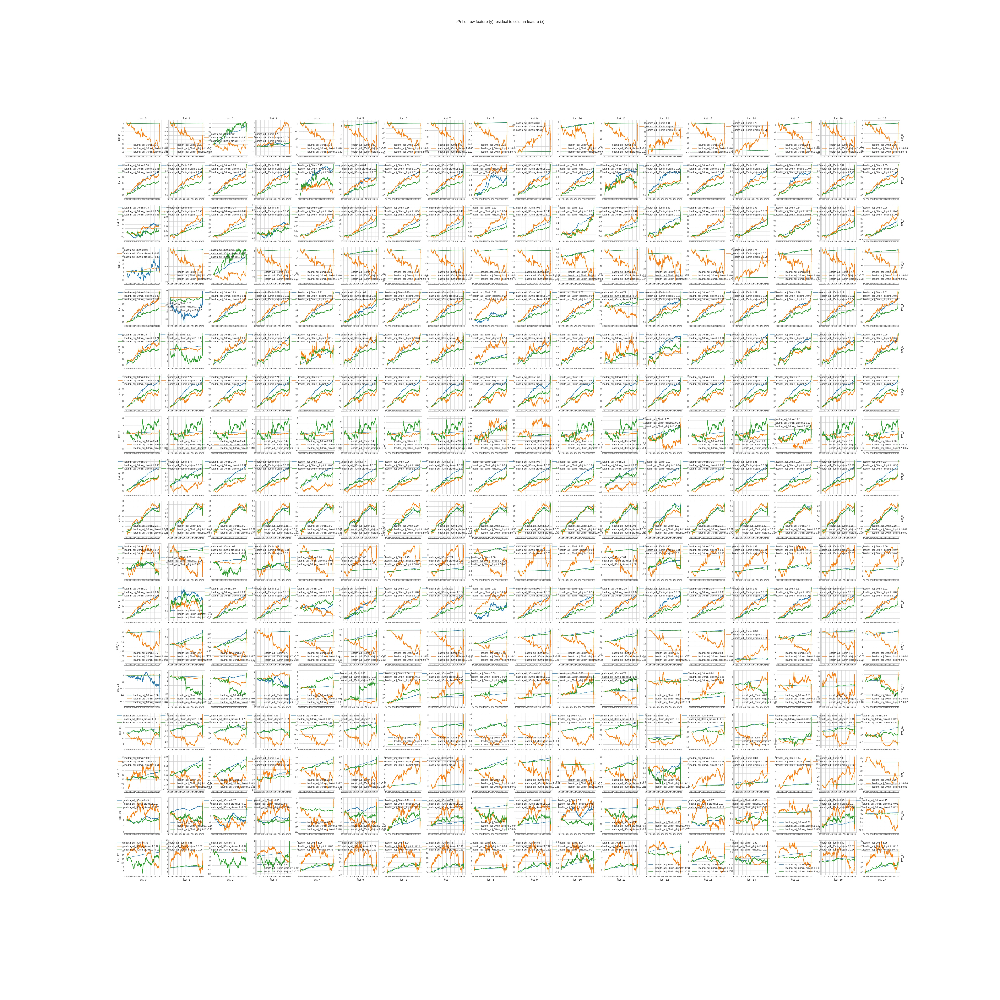

In [14]:
# run the online learner on BaselineEnsemble_2020.06.09 using the individual models as features
BASELINE_NAME = 'OnlineRunner_9fcf514b3'
BASELINE_NOTES = 'run the online learner on BaselineEnsemble_2020.06.09 using the individual models as features'
make_baseline = True

disp( BASELINE_NAME, h=1 )
disp( BASELINE_NOTES, h=2 )

data = mx.Baseline.load( 'BaselineEnsemble_2020.06.09' )
baselined_forecasts = ['leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_e7d983f5e',
 'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_d5cf610a7',
 'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_73844bf6b',
 'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_ac791de12',
 'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_17e75d09f',
 'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_6c9fbc725',
 'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_0a8924518',
 'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_f5b754d37',
 'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_cdc0aaa37',
 'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_eed1a978d',
 'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_854f955c7',
 'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_dacf3bfd0']

pipeline_hps = mx.HPSet(
    # stuff related to pre and post processing
    start='20120101', #
    end=hps.end,  #
    # the feature sets
    features=sorted( set(
        []
        #+ ['open_unadj_30min', 'log_open_unadj_30min', 'lagrtn_adj_30min_resid', ]
        #+ hps.feature_set.lagging
        #+ hps.feature_set.vol
        #+ hps.feature_set.log_volumes
        # + hps.feature_set.calendar
        #+ hps.feature_set.mkt
        #+ hps.feature_set.betas
        # + hps.feature_set.technical
        # + hps.feature_set.afacs
        # other baselines as features
        + baselined_forecasts
    ) ),
    targets=(
        ['leadrtn_adj_30min'] 
        +['leadrtn_adj_30min_disjoint.1', 'leadrtn_adj_30min_disjoint.2']
    ),
    weight='valid_30min',
    # related to pca
    pca=None, 
    # related to preprocessing
    preprocess=mx.HPSet(
        symbol=None,
        winsorize_target=False, #winsorize returns
        winsorize_features=0.01, # winsorize features
        demean_features=False,
        normalize_features=False,
    ),        
    # online Runner hyperparameters
    online = mx.HPSet(
        # stuff related to online learning
        lookahead=2,
        ridge=1e-5,
        hl_1=None,
        hl_2=None,
        lr=500,
        kappa=10,  # util penalty
        tv=None,  # {1:1, 2:1, 13:1e-1},
        ortho=2,
        ortho_hl=13,
        # feautres to orthogonal out
        ortho_features=(
            []                
            + ['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day']  # tilt and mean revrsion        
            + hps.feature_set.betas # market
        ),
        algo='mbprox',
        batch_size=5000,    
        # stuff related to sid weighting
        use_omega='P',
        omega_lr=10,
        omega_ridge=0,
        omega_shift=0.1,    
        # the transformer
        transformer=mx.HPSet( pre_normalize=True, quadratic=True, post_normalize=True, ema_halflifes=[None, 5*13, 10*13], ),
        # -- stuff for running regressions ---
        regression_exposures=(
            ['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_30min']         
        ),
        regression_targets=['leadrtn_adj_30min', 'leadrtn_adj_30min_disjoint.1', 'leadrtn_adj_30min_disjoint.2'],
    )
)
 
from research.etf_technical import online_runner as reor; reload( reor )
    
# is this baselined  - then load from baseline cache
baseline = None
if BASELINE_NAME:
    try:
        baseline = mx.Baseline.load( BASELINE_NAME )
        assert baseline_hps == pipeline_hps, 'failure to valdiate hyperparams'
        disp( 'loaded ',  BASELINE_NAME, ' from baseline cache', h=3, color='orange' )        
        output_meta = baseline.output_meta
        output_features = baseline.output_features
    except Exception as e:
        disp( 'did not find ', BASELINE_NAME, 'in baseline cache because ', e, '\n  running', h=3, color='purple' )
        
# run the runner if needed
if baseline is None:
    disp( mx.tensorboard.start_server( ) )
    disp( mx.tensorboard.start( clear=True ) )    
    runner = reor.online_pipeline( data=data, hps=pipeline_hps, memoize=make_baseline )
    disp( f'Expected {BASELINE_NAME}  got ', runner.hash(), h=4, color='teal' )
    runner.run()
    output_meta =  runner.output_meta
    output_features = runner.output_features
    # baseline this if needed
    if make_baseline:
        baseline = mx.Baseline.make( runner, hps=pipeline_hps, notebook=Config.code,  notes=BASELINE_NOTES, name=BASELINE_NAME  )
        disp( 'Baselined ', runner.hash(), h=4, color='teal' )
    else:
        baseline = runner

# --- show the results---
for profile in output_meta.get('profiler', []):
    main_fig = profile['main_fig']
    exp_fig = profile['exp_fig']
    reg_fig = profile['reg_fig'] 
    reg_df = profile['regressions']
    if not reg_df.empty: reg_df = reg_df.set_index( ['returns', 'lag'] )
    disp( profile['feature'],  h=3, hr=True )    
    disp( 'Regressions', reg_df, h=4 )
    disp( reg_fig  )
    disp( exp_fig )
    
# compare this with other forecasts in the same dataarray if needed ...
comparator_forecasts = baselined_forecasts + baseline.output_features
if comparator_forecasts:
    rename_map = OrderedDict( [(fcst, f'fcst_{i}') for i, fcst in enumerate( comparator_forecasts ) ] ) 
    renamed_data = mx.RenameFeatures( new_features=list( rename_map.values() )  )
    renamed_data.set( data=baseline, features=list(rename_map.keys()), memoize=False )
    renamed_data.run()
    comparator = mx.ForecastComparator( targets=pipeline_hps.targets, weight=pipeline_hps.weight, winlen=None )
    comparator.set( data=renamed_data, features=renamed_data.output_features, memoize=baseline.memoize )
    comparator.run()        
    results = comparator.output_meta        
    disp( f'Comparison for ', pd.DataFrame( rename_map.values(), rename_map.keys() ), h=1 )
    disp( 'Static Forecast correlations', results['fcst_corrs'], h=2 )
    disp( 'Static Orthog SRs', results['static_osrs'], h=2 )
    disp( 'Static Orthog Pnl', results['static_opnl'], h=2 )
    if 'roll_osrs' in results:
        disp( 'Rolling Orthog SRs', results['roll_osrs'], h=2 )
        disp( 'Rolling Orthog Pnl', results['roll_opnl'], h=2 )
        
# compare with other baseliens if needed
if False:
    A = baseline    
    comparator = mx.ForecastComparator( targets=pipeline_hps.online.regression_targets, weight=pipeline_hps.weight )
    B = mx.Baseline.load(  )
    disp( 'Comparing A=', A.name, A.notes, '\n\t with B=', B.name , B.notes, h=3 )
    comparator.compare( A,  B, A_features=A.output_features[-1],  B_features=B.output_features[-1] )   




# OnlineRunner_115a5fbca
### With the fixed omega logic ( 2020.06.09 ) - no omega weights, quadratic emas'

,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,23576992,0.861042,-0.382537,0.864204,0.013417,0.000180,59.811539,3.775329,0.552192,0.532364,0.475516
leadrtn_adj_30min_disjoint.1,NaN,23576992,0.861017,-0.382537,0.187566,-0.001292,0.000002,-5.521962,-0.490994,0.552192,0.532364,0.475516
leadrtn_adj_30min_disjoint.2,NaN,23576992,0.860994,-0.382537,0.210776,0.008738,0.000076,37.695999,2.559898,0.552192,0.532364,0.475516


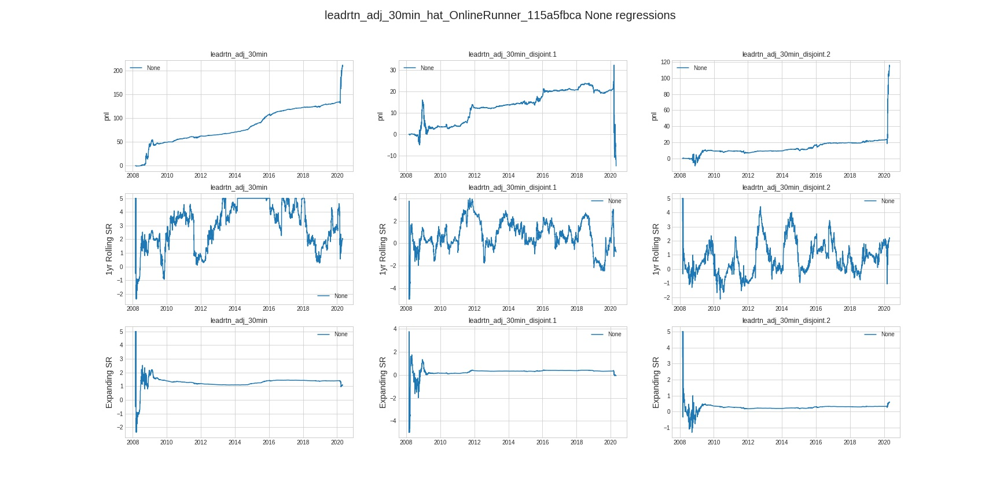

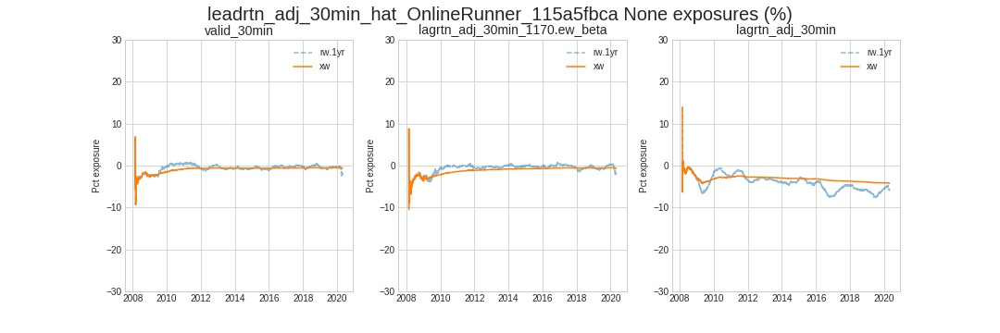

,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,23576992,0.861042,-1.240140e-11,1.189816,0.008625,0.000074,37.738827,9.337357,0.672797,0.640404,0.61432
leadrtn_adj_30min_disjoint.1,NaN,23576992,0.861017,-1.240140e-11,0.203726,0.001359,0.000002,5.279191,2.067193,0.672797,0.640404,0.61432
leadrtn_adj_30min_disjoint.2,NaN,23576992,0.860994,-1.240140e-11,0.207703,0.002142,0.000005,8.836863,2.913740,0.672797,0.640404,0.61432


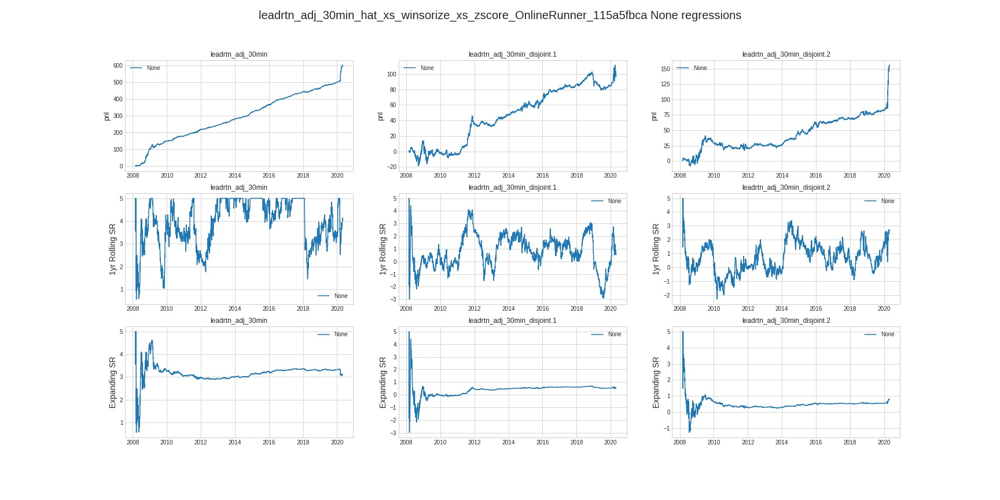

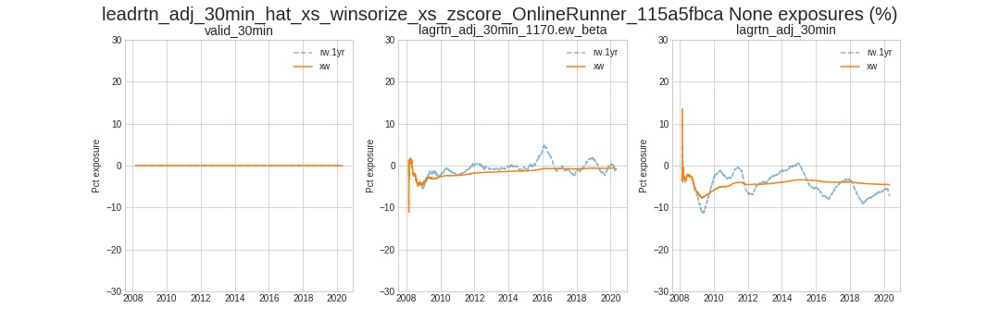

NameError: name 'mxc' is not defined

In [25]:
# OnlineRunner_115a5fbca
##############
%inline
from research.etf_technical import online_runner as reor; reload( reor )

BASELINE_NAME = 'OnlineRunner_115a5fbca'
BASELINE_NOTES = 'With the fixed omega logic ( 2020.06.09 ) - no omega weights, quadratic emas'
make_baseline = True

disp( BASELINE_NAME, h=1 )
disp( BASELINE_NOTES, h=3 )    

# load up a previous baseline as reference and rename its output features
data = mx.Baseline.load( 'BaselineEnsemble_2020.06.09' )

baselined_forecasts = ['leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_e7d983f5e',
 'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_d5cf610a7',
 'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_73844bf6b',
 'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_ac791de12',
 'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_17e75d09f',
 'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_6c9fbc725',
 'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_0a8924518',
 'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_f5b754d37',
 'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_cdc0aaa37',
 'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_eed1a978d',
 'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_854f955c7',
 'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_dacf3bfd0']

pipeline_hps = mx.HPSet(
    # stuff related to pre and post processing
    start='20080101',
    end=hps.end,  #
    # the feature sets
    features=sorted( set(
        []
        + ['open_unadj_30min', 'log_open_unadj_30min', 'lagrtn_adj_30min_resid', ]
        + hps.feature_set.lagging
        + hps.feature_set.vol
        + hps.feature_set.log_volumes
        # + hps.feature_set.calendar
        + hps.feature_set.mkt
        + hps.feature_set.betas
        # + hps.feature_set.technical
        # + hps.feature_set.afacs                
    ) ),
    targets=(
        ['leadrtn_adj_30min'] 
        #+['leadrtn_adj_30min_disjoint.1', 'leadrtn_adj_30min_disjoint.2']
    ),
    weight='valid_30min',
    # related to pca
    pca=None, 
    # related to preprocessing
    preprocess=mx.HPSet(
        symbol=None,
        winsorize_target=False, #winsorize returns
        winsorize_features=0.01, # winsorize features
        demean_features=False,
        normalize_features=False,
    ),        
    # online Runner hyperparameters
    online = mx.HPSet(
        # stuff related to online learning
        lookahead=2,
        ridge=1e-5,
        hl_1=None,
        hl_2=None,
        lr=500,
        kappa=10,  # util penalty
        tv=None,  # {1:1, 2:1, 13:1e-1},
        ortho=2,
        ortho_hl=13,
        # feautres to orthogonal out
        ortho_features=(
            []                
            + ['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day']  # tilt and mean revrsion        
            + hps.feature_set.betas # market
        ),
        algo='mbprox',
        batch_size=5000,    
        # stuff related to sid weighting
        use_omega=None,
        omega_lr=1e-5,
        omega_ridge=0,
        omega_shift=0.1,    
        # the transformer
        transformer=mx.HPSet( pre_normalize=True, quadratic=True, post_normalize=True, ema_halflifes=[13 * 5, 13 * 20, 13 * 40], ),
        # -- stuff for running regressions ---
        regression_exposures=(
            ['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_30min']         
        ),
        regression_targets=['leadrtn_adj_30min', 'leadrtn_adj_30min_disjoint.1', 'leadrtn_adj_30min_disjoint.2'],
    )
)

from research.etf_technical import online_runner as reor; reload( reor )
    
# is this baselined  - then load from baseline cache
baseline = None
if BASELINE_NAME:
    try:
        baseline = mx.Baseline.load( BASELINE_NAME )
        assert baseline_hps == pipeline_hps, 'failure to valdiate hyperparams'
        disp( 'loaded ',  BASELINE_NAME, ' from baseline cache', h=3, color='orange' )        
        output_meta = baseline.output_meta
        output_features = baseline.output_features
    except Exception as e:
        disp( 'did not find ', BASELINE_NAME, 'in baseline cache because ', e, '\n  running', h=3, color='purple' )
        
# run the runner if needed
if baseline is None:
    disp( mx.tensorboard.start_server( ) )
    disp( mx.tensorboard.start( clear=True ) )    
    runner = reor.online_pipeline( data=data, hps=pipeline_hps, memoize=True )
    disp( f'Expected {BASELINE_NAME}  got ', runner.hash(), h=4, color='teal' )
    runner.run()
    output_meta =  runner.output_meta
    output_features = runner.output_features
    # baseline this if needed
    if make_baseline:
        baseline = mx.Baseline.make( runner, hps=pipeline_hps, notebook=Config.code,  notes=BASELINE_NOTES, name=BASELINE_NAME  )
        disp( 'Baselined ', runner.hash(), h=4, color='teal' )
    else:
        baseline = runner

# --- show the results---
for profile in output_meta.get('profiler', []):
    main_fig = profile['main_fig']
    exp_fig = profile['exp_fig']
    reg_fig = profile['reg_fig'] 
    reg_df = profile['regressions']
    if not reg_df.empty: reg_df = reg_df.set_index( ['returns', 'lag'] )
    disp( profile['feature'],  h=3, hr=True )    
    disp( 'Regressions', reg_df, h=4 )
    disp( reg_fig  )
    disp( exp_fig )
    
# compare this with other forecasts in the same dataarray if needed ...
comparator_forecasts = baselined_forecasts + [baseline.output_features[-1]]
if comparator_forecasts:
    rename_map = OrderedDict( [(fcst, f'fcst_{i}') for i, fcst in enumerate( comparator_forecasts ) ] ) 
    renamed_data = mx.RenameFeatures( new_features=list( rename_map.values() )  )
    renamed_data.set( data=baseline, features=list(rename_map.keys()), memoize=False )
    renamed_data.run()
    comparator = mx.ForecastComparator( targets=pipeline_hps.targets, weight=pipeline_hps.weight, winlen=None )
    comparator.set( data=renamed_data, features=renamed_data.output_features, memoize=baseline.memoize )
    comparator.run()        
    results = comparator.output_meta        
    disp( f'Comparison for ', pd.DataFrame( rename_map.values(), rename_map.keys() ), h=1 )
    disp( 'Static Forecast correlations', results['fcst_corrs'], h=2 )
    disp( 'Static Orthog SRs', results['static_osrs'], h=2 )
    disp( 'Static Orthog Pnl', results['static_opnl'], h=2 )
    if 'roll_osrs' in results:
        disp( 'Rolling Orthog SRs', results['roll_osrs'], h=2 )
        disp( 'Rolling Orthog Pnl', results['roll_opnl'], h=2 )
        
# compare with other baseliens if needed
if False:
    A = baseline    
    comparator = mx.ForecastComparator( targets=pipeline_hps.online.regression_targets, weight=pipeline_hps.weight )
    B = mx.Baseline.load(  )
    disp( 'Comparing A=', A.name, A.notes, '\n\t with B=', B.name , B.notes, h=3 )
    comparator.compare( A,  B, A_features=A.output_features[-1],  B_features=B.output_features[-1] )   

# OnlineRunner_de2682810
## With the fixed omega logic ( 2020.06.09 ) - P-omega weights, quadratic emas (derived from OnlineRunner_115a5fbca)

,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,23280992,0.863779,-0.370814,0.886457,0.013141,0.000173,58.209148,3.709992,0.557788,0.536881,0.47949
leadrtn_adj_30min_disjoint.1,NaN,23280992,0.863753,-0.370814,0.192336,-0.001245,0.000002,-6.303555,-0.566517,0.557788,0.536881,0.47949
leadrtn_adj_30min_disjoint.2,NaN,23280992,0.863730,-0.370814,0.199598,0.008752,0.000077,37.686680,2.550592,0.557788,0.536881,0.47949


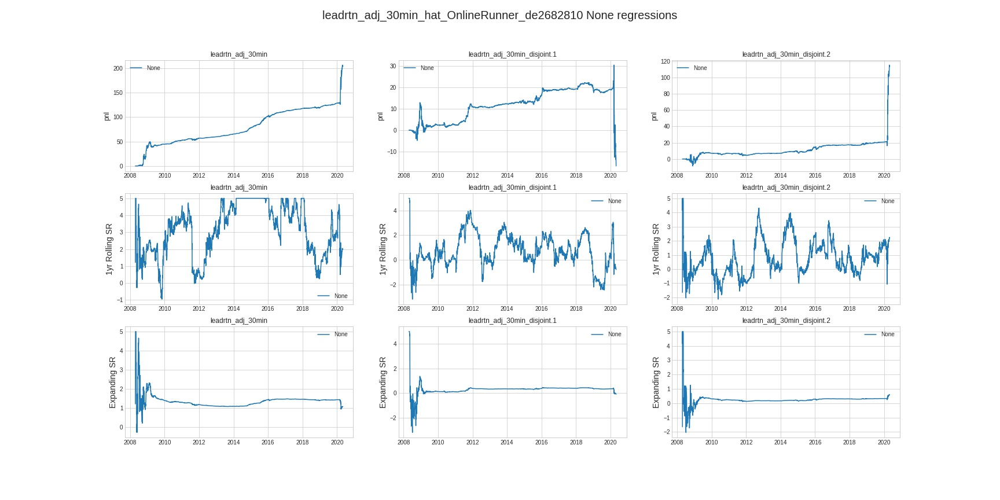

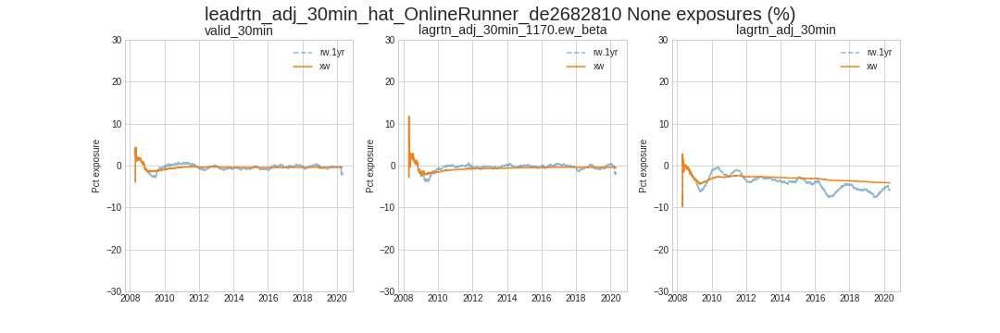

,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,23280992,0.863779,-1.896864e-11,1.179202,0.008344,0.000070,36.484516,9.116591,0.676758,0.644185,0.617286
leadrtn_adj_30min_disjoint.1,NaN,23280992,0.863753,-1.896864e-11,0.191554,0.001145,0.000001,5.079914,1.998112,0.676758,0.644185,0.617286
leadrtn_adj_30min_disjoint.2,NaN,23280992,0.863730,-1.896864e-11,0.160614,0.001983,0.000004,8.531317,2.826898,0.676758,0.644185,0.617286


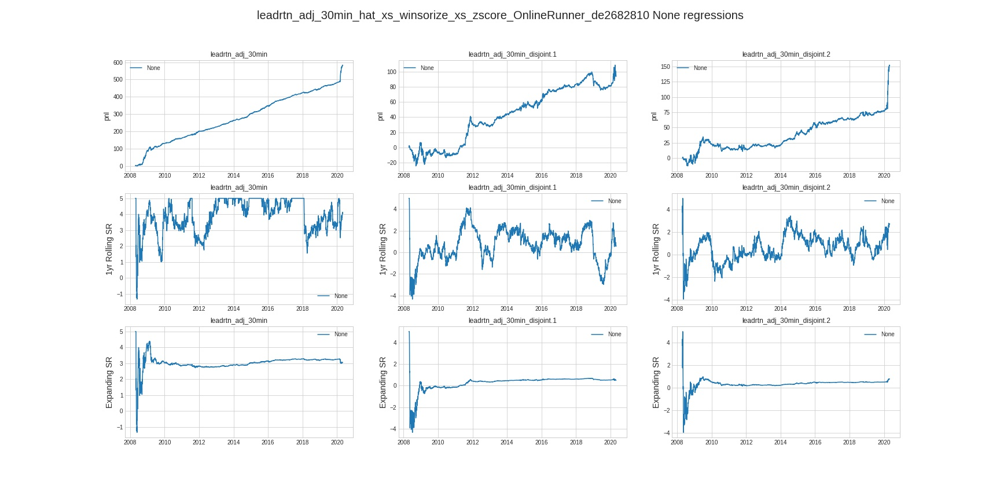

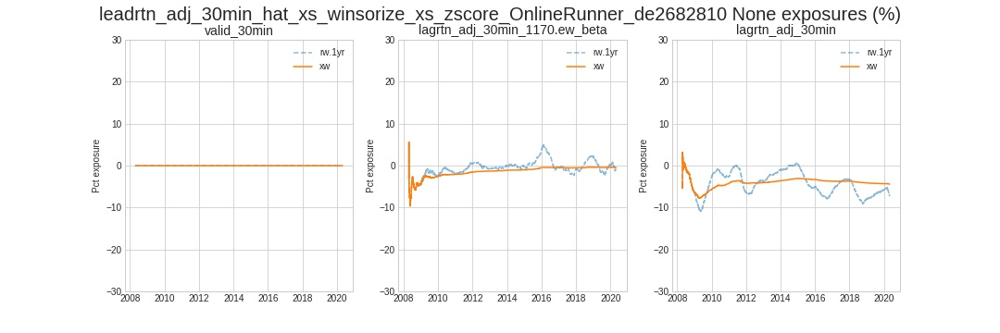

,0
leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_115a5fbca,fcst_0
leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_de2682810,fcst_1


,fcst_0,fcst_1
fcst_0,1.000000,0.992905
fcst_1,0.992905,1.000000


,x,fcst_0,fcst_1
y,tgt,,
fcst_0,leadrtn_adj_30min,3.135678,1.242705
fcst_1,leadrtn_adj_30min,-0.832743,3.060912


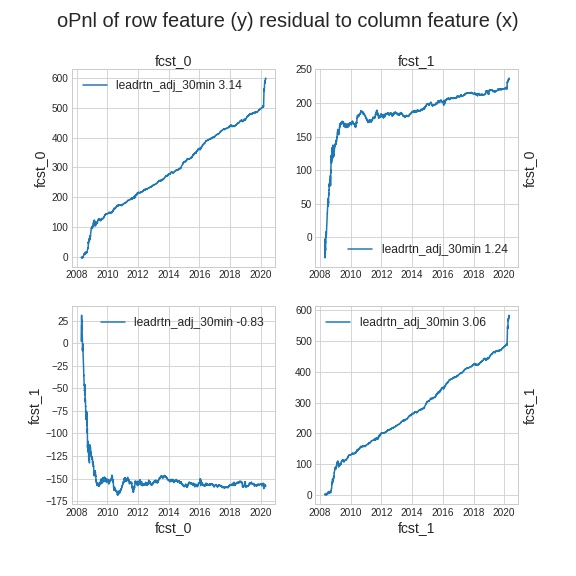

In [34]:
# OnlineRunner_de2682810
##############
%inline
from research.etf_technical import online_runner as reor; reload( reor )

BASELINE_NAME = 'OnlineRunner_de2682810'
BASELINE_NOTES = 'With the fixed omega logic ( 2020.06.09 ) - P-omega weights, quadratic emas (derived from OnlineRunner_115a5fbca)'
make_baseline = True

disp( BASELINE_NAME, h=1 )
disp( BASELINE_NOTES, h=3 )    
On
# load up a previous baseline as reference and rename its output features
data = mx.Baseline.load( 'OnlineRunner_115a5fbca' )

baselined_forecasts = ['leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_e7d983f5e',
 'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_d5cf610a7',
 'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_73844bf6b',
 'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_ac791de12',
 'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_17e75d09f',
 'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_6c9fbc725',
 'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_0a8924518',
 'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_f5b754d37',
 'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_cdc0aaa37',
 'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_eed1a978d',
 'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_854f955c7',
 'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_dacf3bfd0',
 'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_115a5fbca',
]

pipeline_hps = mx.HPSet(
    # stuff related to pre and post processing
    start='20080101',
    end=hps.end,  #
    # the feature sets
    features=sorted( set(
        []
        + ['open_unadj_30min', 'log_open_unadj_30min', 'lagrtn_adj_30min_resid', ]
        + hps.feature_set.lagging
        + hps.feature_set.vol
        + hps.feature_set.log_volumes
        # + hps.feature_set.calendar
        + hps.feature_set.mkt
        + hps.feature_set.betas
        # + hps.feature_set.technical
        # + hps.feature_set.afacs                
    ) ),
    targets=(
        ['leadrtn_adj_30min'] 
        #+['leadrtn_adj_30min_disjoint.1', 'leadrtn_adj_30min_disjoint.2']
    ),
    weight='valid_30min',
    # related to pca
    pca=None, 
    # related to preprocessing
    preprocess=mx.HPSet(
        symbol=None,
        winsorize_target=False, #winsorize returns
        winsorize_features=0.01, # winsorize features
        demean_features=False,
        normalize_features=False,
    ),        
    # online Runner hyperparameters
    online = mx.HPSet(
        # stuff related to online learning
        lookahead=2,
        ridge=1e-5,
        hl_1=None,
        hl_2=None,
        lr=500,
        kappa=10,  # util penalty
        tv=None,  # {1:1, 2:1, 13:1e-1},
        ortho=2,
        ortho_hl=13,
        # feautres to orthogonal out
        ortho_features=(
            []                
            + ['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day']  # tilt and mean revrsion        
            + hps.feature_set.betas # market
        ),
        algo='mbprox',
        batch_size=5000,    
        # stuff related to sid weighting
        use_omega='P',
        omega_lr=1e-2,
        omega_ridge=0,
        omega_shift=0.1,    
        # the transformer
        transformer=mx.HPSet( pre_normalize=True, quadratic=True, post_normalize=True, ema_halflifes=[13 * 5, 13 * 20, 13 * 40], ),
        # -- stuff for running regressions ---
        regression_exposures=(
            ['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_30min']         
        ),
        regression_targets=['leadrtn_adj_30min', 'leadrtn_adj_30min_disjoint.1', 'leadrtn_adj_30min_disjoint.2'],
    )
)

from research.etf_technical import online_runner as reor; reload( reor )
    
# is this baselined  - then load from baseline cache
baseline = None
if BASELINE_NAME:
    try:
        baseline = mx.Baseline.load( BASELINE_NAME )
        assert baseline_hps == pipeline_hps, 'failure to valdiate hyperparams'
        disp( 'loaded ',  BASELINE_NAME, ' from baseline cache', h=3, color='orange' )        
        output_meta = baseline.output_meta
        output_features = baseline.output_features
    except Exception as e:
        disp( 'did not find ', BASELINE_NAME, 'in baseline cache because ', e, '\n  running', h=3, color='purple' )
        
# run the runner if needed
if baseline is None:
    disp( mx.tensorboard.start( clear=True ) )    
    disp( mx.tensorboard.start_server( ) )
    runner = reor.online_pipeline( data=data, hps=pipeline_hps, memoize=True )
    disp( f'Expected {BASELINE_NAME}  got ', runner.hash(), h=4, color='teal' )
    runner.run()
    output_meta =  runner.output_meta
    output_features = runner.output_features
    # baseline this if needed
    if make_baseline:
        baseline = mx.Baseline.make( runner, hps=pipeline_hps, notebook=Config.code,  notes=BASELINE_NOTES, name=BASELINE_NAME  )
        disp( 'Baselined ', runner.hash(), h=4, color='teal' )
    else:
        baseline = runner

# --- show the results---
for profile in output_meta.get('profiler', []):
    main_fig = profile['main_fig']
    exp_fig = profile['exp_fig']
    reg_fig = profile['reg_fig'] 
    reg_df = profile['regressions']
    if not reg_df.empty: reg_df = reg_df.set_index( ['returns', 'lag'] )
    disp( profile['feature'],  h=3, hr=True )    
    disp( 'Regressions', reg_df, h=4 )
    disp( reg_fig  )
    disp( exp_fig )
    
# compare this with other forecasts in the same dataarray if needed ...
comparator_forecasts = [baselined_forecasts[-1]] + [baseline.output_features[-1]]
if comparator_forecasts:
    rename_map = OrderedDict( [(fcst, f'fcst_{i}') for i, fcst in enumerate( comparator_forecasts ) ] ) 
    renamed_data = mx.RenameFeatures( new_features=list( rename_map.values() )  )
    renamed_data.set( data=baseline, features=list(rename_map.keys()), memoize=False )
    renamed_data.run()
    comparator = mx.ForecastComparator( targets=pipeline_hps.targets, weight=pipeline_hps.weight, winlen=None )
    comparator.set( data=renamed_data, features=renamed_data.output_features, memoize=baseline.memoize )
    comparator.run()        
    results = comparator.output_meta        
    disp( f'Comparison for ', pd.DataFrame( rename_map.values(), rename_map.keys() ), h=1 )
    disp( 'Static Forecast correlations', results['fcst_corrs'], h=2 )
    disp( 'Static Orthog SRs', results['static_osrs'], h=2 )
    disp( 'Static Orthog Pnl', results['static_opnl'], h=2 )
    if 'roll_osrs' in results:
        disp( 'Rolling Orthog SRs', results['roll_osrs'], h=2 )
        disp( 'Rolling Orthog Pnl', results['roll_opnl'], h=2 )
        
# compare with other baseliens if needed
if False:
    A = baseline    
    comparator = mx.ForecastComparator( targets=pipeline_hps.online.regression_targets, weight=pipeline_hps.weight )
    B = mx.Baseline.load(  )
    disp( 'Comparing A=', A.name, A.notes, '\n\t with B=', B.name , B.notes, h=3 )
    comparator.compare( A,  B, A_features=A.output_features[-1],  B_features=B.output_features[-1] )   

# OnlineRunner_9461ce8af
## With the fixed omega logic ( 2020.06.09 ) - P-omega weights, quadratic emas with more lr (derived from OnlineRunner_de2682810)

,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,22984992,0.866510,-0.392866,0.895619,0.013056,0.000170,57.777515,3.637054,0.547485,0.526543,0.469906
leadrtn_adj_30min_disjoint.1,NaN,22984992,0.866484,-0.392866,0.190026,-0.001381,0.000002,-6.662162,-0.600667,0.547485,0.526543,0.469906
leadrtn_adj_30min_disjoint.2,NaN,22984992,0.866460,-0.392866,0.199985,0.009050,0.000082,38.843040,2.607219,0.547485,0.526543,0.469906


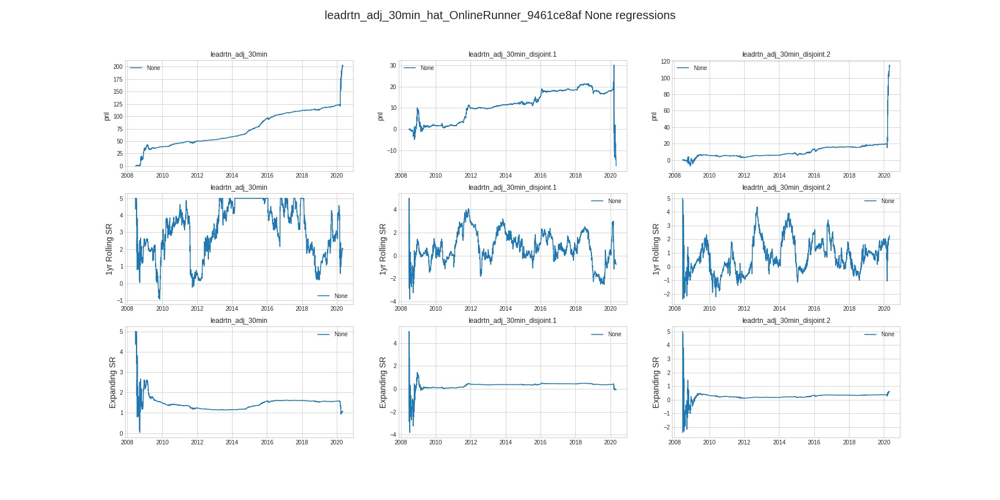

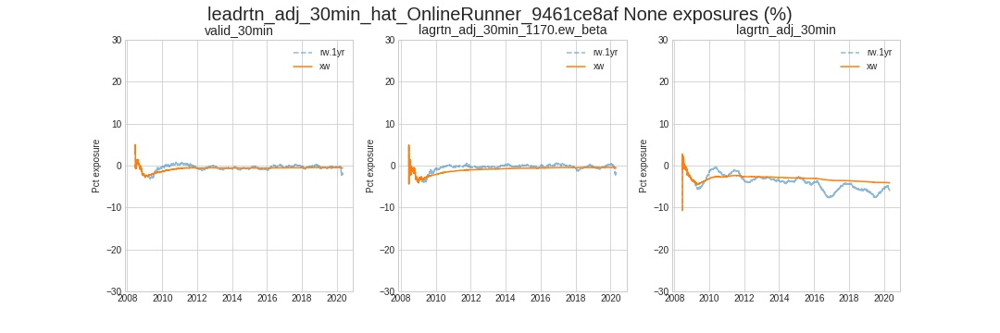

,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,22984992,0.866510,-7.699245e-11,1.198786,0.008315,0.000069,36.256134,9.029786,0.675813,0.644419,0.617893
leadrtn_adj_30min_disjoint.1,NaN,22984992,0.866484,-7.699245e-11,0.208898,0.001525,0.000002,5.484712,2.175649,0.675813,0.644419,0.617893
leadrtn_adj_30min_disjoint.2,NaN,22984992,0.866460,-7.699245e-11,0.170683,0.002072,0.000004,8.523304,2.826489,0.675813,0.644419,0.617893


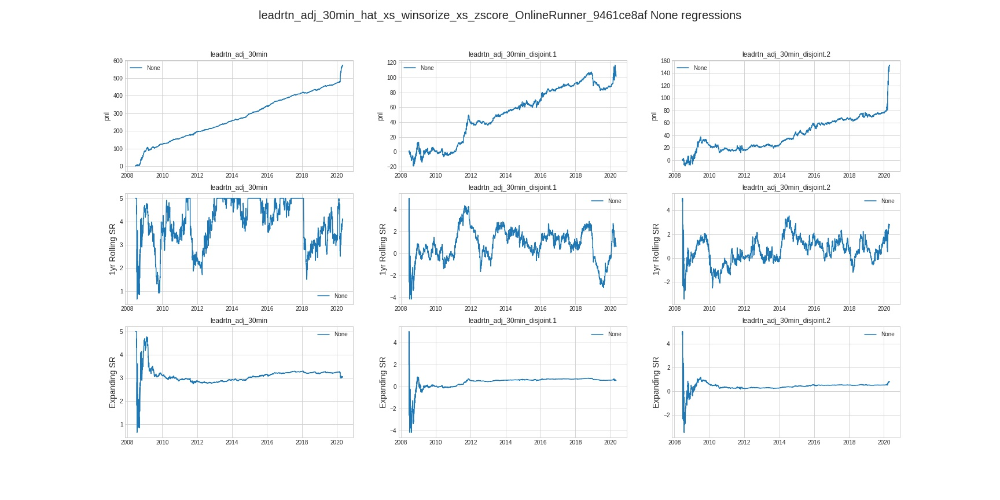

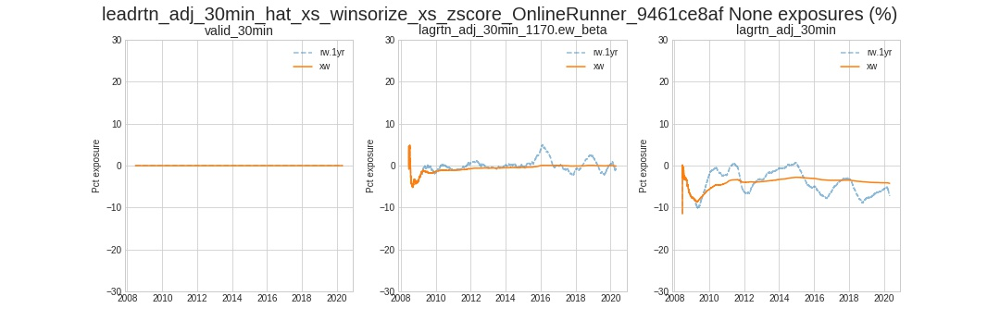

,0
leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_dacf3bfd0,fcst_0
leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_115a5fbca,fcst_1
leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_de2682810,fcst_2
leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_9461ce8af,fcst_3


,fcst_0,fcst_1,fcst_2,fcst_3
fcst_0,1.000000,0.248314,0.248182,0.246487
fcst_1,0.248314,1.000000,0.995890,0.986985
fcst_2,0.248182,0.995890,1.000000,0.994406
fcst_3,0.246487,0.986985,0.994406,1.000000


,x,fcst_0,fcst_1,fcst_2,fcst_3
y,tgt,,,,
fcst_0,leadrtn_adj_30min,1.943815,1.131858,1.173335,1.186713
fcst_1,leadrtn_adj_30min,3.168060,3.135251,1.150350,0.927921
fcst_2,leadrtn_adj_30min,3.101653,-0.886011,3.073013,0.278292
fcst_3,leadrtn_adj_30min,3.074134,-0.428742,0.023920,3.049272


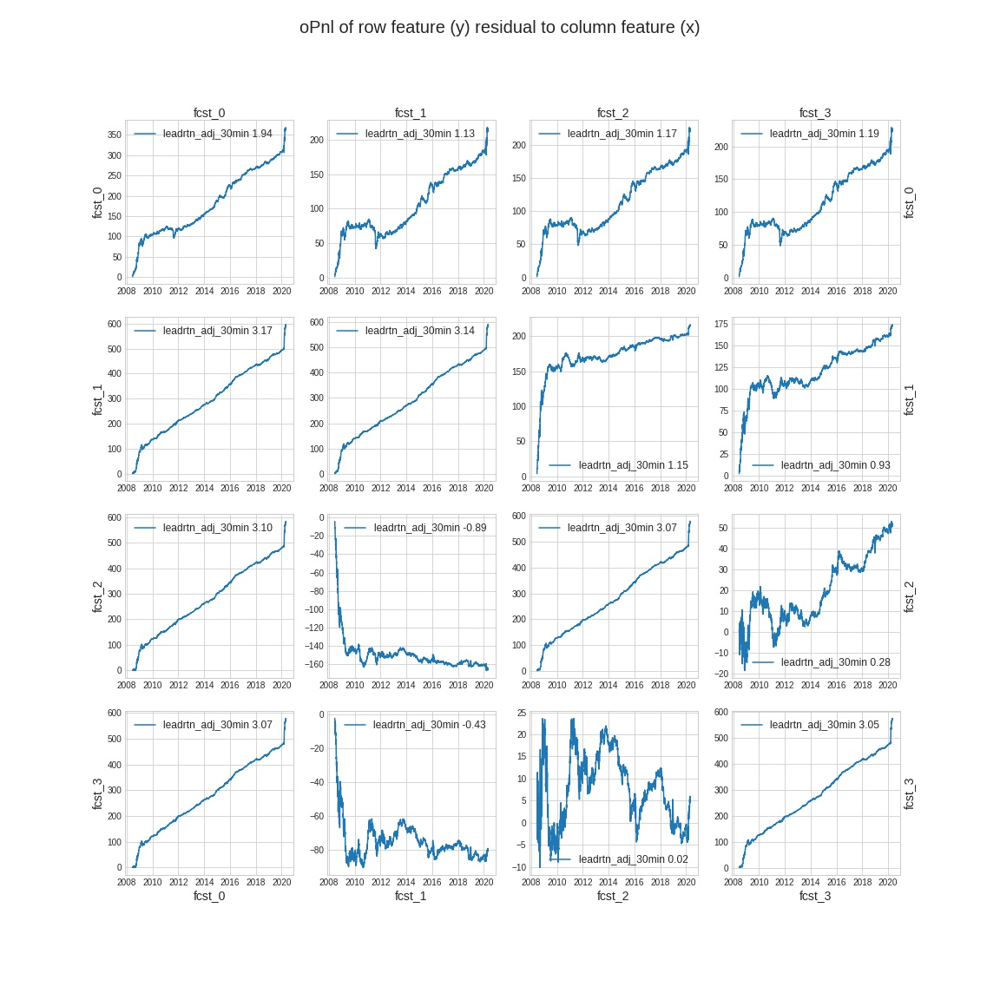

In [12]:
# OnlineRunner_9461ce8af
##############
%inline
from research.etf_technical import online_runner as reor; reload( reor )

BASELINE_NAME = 'OnlineRunner_9461ce8af'
BASELINE_NOTES = 'With the fixed omega logic ( 2020.06.09 ) - P-omega weights, quadratic emas with more lr (derived from OnlineRunner_de2682810)'
make_baseline = True

disp( BASELINE_NAME, h=1 )
disp( BASELINE_NOTES, h=3 )    

# load up a previous baseline as reference and rename its output features
data = mx.Baseline.load( 'OnlineRunner_de2682810' )

baselined_forecasts = [
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_e7d983f5e',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_d5cf610a7',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_73844bf6b',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_ac791de12',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_17e75d09f',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_6c9fbc725',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_0a8924518',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_f5b754d37',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_cdc0aaa37',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_eed1a978d',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_854f955c7',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_dacf3bfd0',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_115a5fbca',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_de2682810',                    
]

pipeline_hps = mx.HPSet(
    # stuff related to pre and post processing
    start='20080101',
    end=hps.end,  #
    # the feature sets
    features=sorted( set(
        []
        + ['open_unadj_30min', 'log_open_unadj_30min', 'lagrtn_adj_30min_resid', ]
        + hps.feature_set.lagging
        + hps.feature_set.vol
        + hps.feature_set.log_volumes
        # + hps.feature_set.calendar
        + hps.feature_set.mkt
        + hps.feature_set.betas
        # + hps.feature_set.technical
        # + hps.feature_set.afacs                
    ) ),
    targets=(
        ['leadrtn_adj_30min'] 
        #+['leadrtn_adj_30min_disjoint.1', 'leadrtn_adj_30min_disjoint.2']
    ),
    weight='valid_30min',
    # related to pca
    pca=None, 
    # related to preprocessing
    preprocess=mx.HPSet(
        symbol=None,
        winsorize_target=False, #winsorize returns
        winsorize_features=0.01, # winsorize features
        demean_features=False,
        normalize_features=False,
    ),        
    # online Runner hyperparameters
    online = mx.HPSet(
        # stuff related to online learning
        lookahead=2,
        ridge=1e-5,
        hl_1=None,
        hl_2=None,
        lr=500,
        kappa=10,  # util penalty
        tv=None,  # {1:1, 2:1, 13:1e-1},
        ortho=2,
        ortho_hl=13,
        # feautres to orthogonal out
        ortho_features=(
            []                
            + ['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day']  # tilt and mean revrsion        
            + hps.feature_set.betas # market
        ),
        algo='mbprox',
        batch_size=5000,    
        # stuff related to sid weighting
        use_omega='P',
        omega_lr=1,
        omega_ridge=0.1,
        omega_shift=0.1,    
        # the transformer
        transformer=mx.HPSet( pre_normalize=True, quadratic=True, post_normalize=True, ema_halflifes=[13 * 5, 13 * 20, 13 * 40], ),
        # -- stuff for running regressions ---
        regression_exposures=(
            ['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_30min']         
        ),
        regression_targets=['leadrtn_adj_30min', 'leadrtn_adj_30min_disjoint.1', 'leadrtn_adj_30min_disjoint.2'],
    )
)

from research.etf_technical import online_runner as reor; reload( reor )
    
# is this baselined  - then load from baseline cache
baseline = None
if BASELINE_NAME:
    try:
        baseline = mx.Baseline.load( BASELINE_NAME )
        assert baseline_hps == pipeline_hps, 'failure to valdiate hyperparams'
        disp( 'loaded ',  BASELINE_NAME, ' from baseline cache', h=3, color='orange' )        
        output_meta = baseline.output_meta
        output_features = baseline.output_features
    except Exception as e:
        disp( 'did not find ', BASELINE_NAME, 'in baseline cache because ', e, '\n  running', h=3, color='purple' )
        
# run the runner if needed
if baseline is None:
    disp( mx.tensorboard.start( clear=True ) )    
    disp( mx.tensorboard.start_server( ) )
    runner = reor.online_pipeline( data=data, hps=pipeline_hps, memoize=True )
    disp( f'Expected {BASELINE_NAME}  got ', runner.hash(), h=4, color='teal' )
    runner.run()
    output_meta =  runner.output_meta
    output_features = runner.output_features
    # baseline this if needed
    if make_baseline:
        baseline = mx.Baseline.make( runner, hps=pipeline_hps, notebook=Config.code,  notes=BASELINE_NOTES, name=BASELINE_NAME  )
        disp( 'Baselined ', runner.hash(), h=4, color='teal' )
    else:
        baseline = runner

# --- show the results---
for profile in output_meta.get('profiler', []):
    main_fig = profile['main_fig']
    exp_fig = profile['exp_fig']
    reg_fig = profile['reg_fig'] 
    reg_df = profile['regressions']
    if not reg_df.empty: reg_df = reg_df.set_index( ['returns', 'lag'] )
    disp( profile['feature'],  h=3, hr=True )    
    disp( 'Regressions', reg_df, h=4 )
    disp( reg_fig  )
    disp( exp_fig )
    
# compare this with other forecasts in the same dataarray if needed ...
comparator_forecasts = baselined_forecasts[-3:] + [baseline.output_features[-1]]
if comparator_forecasts:
    rename_map = OrderedDict( [(fcst, f'fcst_{i}') for i, fcst in enumerate( comparator_forecasts ) ] ) 
    renamed_data = mx.RenameFeatures( new_features=list( rename_map.values() )  )
    renamed_data.set( data=baseline, features=list(rename_map.keys()), memoize=False )
    renamed_data.run()
    comparator = mx.ForecastComparator( targets=pipeline_hps.targets, weight=pipeline_hps.weight, winlen=None )
    comparator.set( data=renamed_data, features=renamed_data.output_features, memoize=baseline.memoize )
    comparator.run()        
    results = comparator.output_meta        
    disp( f'Comparison for ', pd.DataFrame( rename_map.values(), rename_map.keys() ), h=1 )
    disp( 'Static Forecast correlations', results['fcst_corrs'], h=2 )
    disp( 'Static Orthog SRs', results['static_osrs'], h=2 )
    disp( 'Static Orthog Pnl', results['static_opnl'], h=2 )
    if 'roll_osrs' in results:
        disp( 'Rolling Orthog SRs', results['roll_osrs'], h=2 )
        disp( 'Rolling Orthog Pnl', results['roll_opnl'], h=2 )
        
# compare with other baseliens if needed
if False:
    A = baseline    
    comparator = mx.ForecastComparator( targets=pipeline_hps.online.regression_targets, weight=pipeline_hps.weight )
    B = mx.Baseline.load(  )
    disp( 'Comparing A=', A.name, A.notes, '\n\t with B=', B.name , B.notes, h=3 )
    comparator.compare( A,  B, A_features=A.output_features[-1],  B_features=B.output_features[-1] )   

# OnlineRunner_e4f0c44c9
## P-omega weights residualized OnlineRunner_115a5fbca ( derived from OnlineRunner_9461ce8af)

,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,22688992,0.869111,-0.505706,0.771681,0.005524,3.051758e-05,23.704803,2.256914,0.731538,0.721708,0.674257
leadrtn_adj_30min_disjoint.1,NaN,22688992,0.869085,-0.505706,0.099758,-0.000345,-1.192093e-07,-0.877977,-0.115220,0.731538,0.721708,0.674257
leadrtn_adj_30min_disjoint.2,NaN,22688992,0.869061,-0.505706,0.125744,0.004974,2.473593e-05,20.797157,2.070939,0.731538,0.721708,0.674257


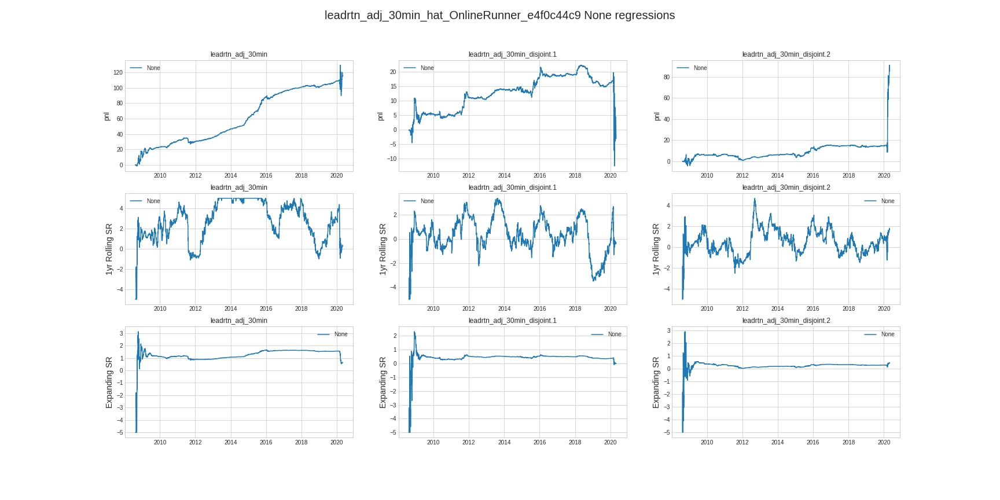

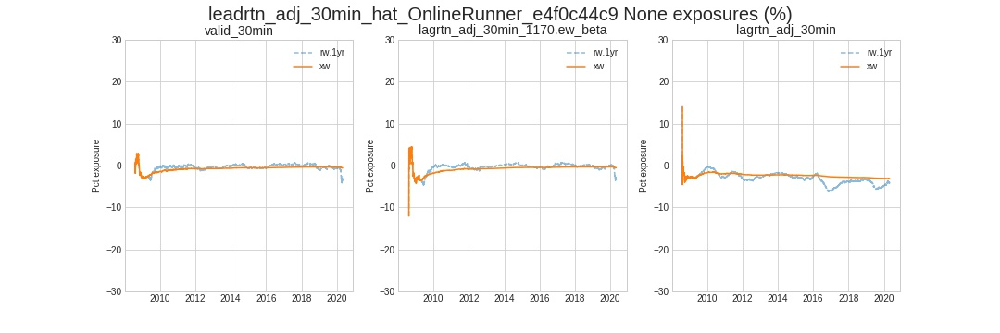

,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,22688992,0.869111,-7.935946e-11,1.073739,0.005270,2.777576e-05,22.448307,8.515548,0.755956,0.744125,0.723889
leadrtn_adj_30min_disjoint.1,NaN,22688992,0.869085,-7.935946e-11,0.146705,0.000880,7.748604e-07,3.745540,1.762939,0.755956,0.744125,0.723889
leadrtn_adj_30min_disjoint.2,NaN,22688992,0.869061,-7.935946e-11,0.117216,0.000598,3.576279e-07,2.536931,1.258461,0.755956,0.744125,0.723889


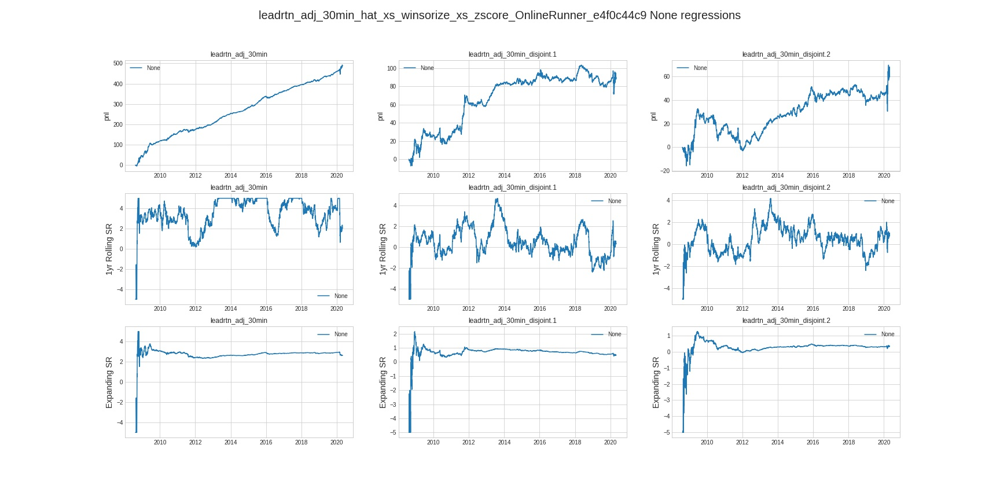

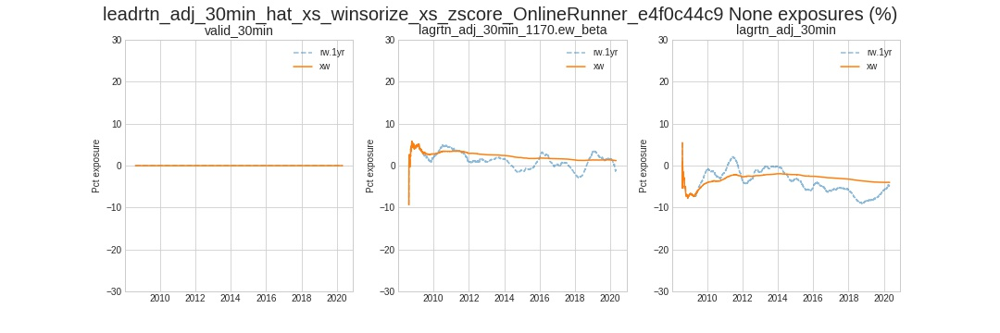

,0
leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_115a5fbca,fcst_0
leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_de2682810,fcst_1
leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_9461ce8af,fcst_2
leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_e4f0c44c9,fcst_3


,fcst_0,fcst_1,fcst_2,fcst_3
fcst_0,1.000000,0.996690,0.988778,0.027714
fcst_1,0.996690,1.000000,0.995507,0.029511
fcst_2,0.988778,0.995507,1.000000,0.034254
fcst_3,0.027714,0.029511,0.034254,1.000000


,x,fcst_0,fcst_1,fcst_2,fcst_3
y,tgt,,,,
fcst_0,leadrtn_adj_30min,3.139553,0.919552,0.781447,3.117711
fcst_1,leadrtn_adj_30min,-0.680611,3.110055,0.323093,3.087031
fcst_2,leadrtn_adj_30min,-0.332679,-0.056594,3.074243,3.048021
fcst_3,leadrtn_adj_30min,2.546909,2.545506,2.535733,2.620172


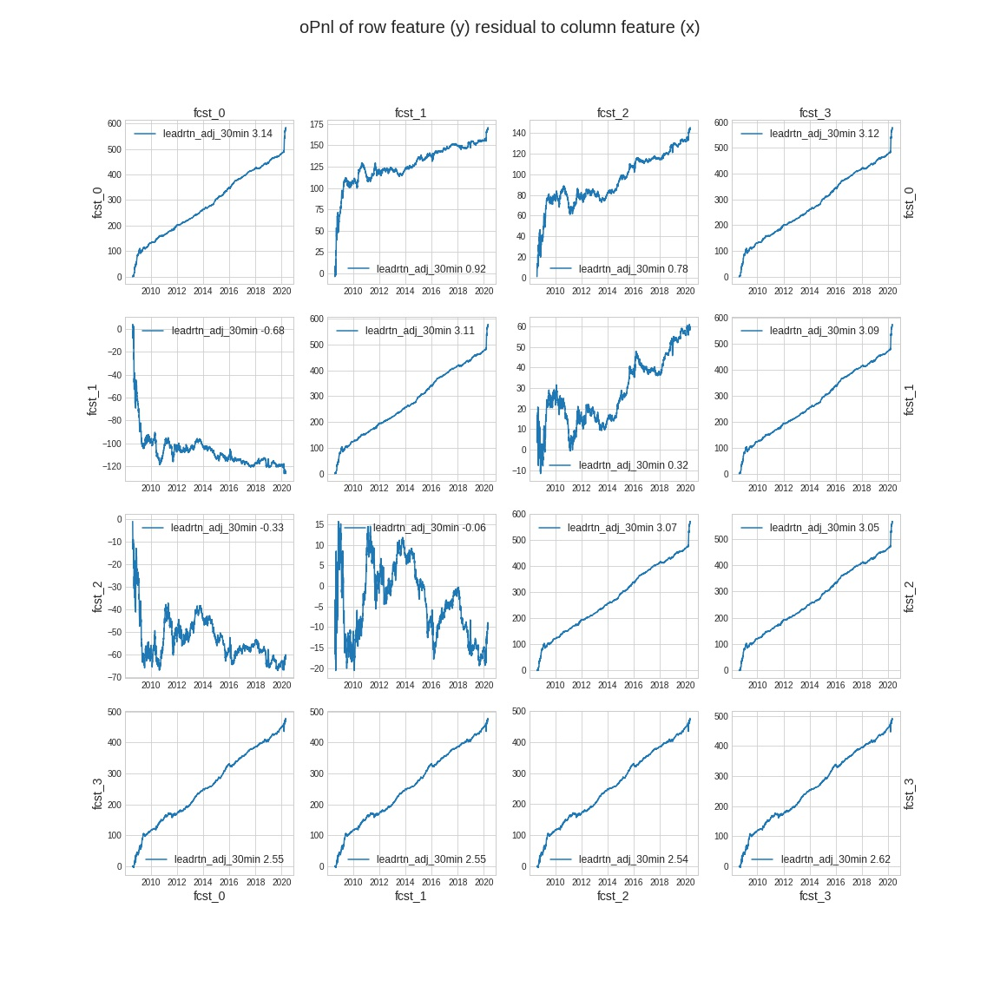

In [16]:
# OnlineRunner_e4f0c44c9
##############
%inline
from research.etf_technical import online_runner as reor; reload( reor )

BASELINE_NAME = 'OnlineRunner_e4f0c44c9'
BASELINE_NOTES = 'P-omega weights residualized OnlineRunner_115a5fbca ( derived from OnlineRunner_9461ce8af)'
make_baseline = True

disp( BASELINE_NAME, h=1 )
disp( BASELINE_NOTES, h=3 )    

# load up a previous baseline as reference and rename its output features
data = mx.Baseline.load( 'OnlineRunner_9461ce8af' )

baselined_forecasts = [
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_e7d983f5e',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_d5cf610a7',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_73844bf6b',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_ac791de12',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_17e75d09f',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_6c9fbc725',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_0a8924518',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_f5b754d37',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_cdc0aaa37',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_eed1a978d',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_854f955c7',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_dacf3bfd0',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_115a5fbca',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_de2682810',                    
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_9461ce8af',                    
]

pipeline_hps = mx.HPSet(
    # stuff related to pre and post processing
    start='20080101',
    end=hps.end,  #
    # the feature sets
    features=sorted( set(
        []
        + ['open_unadj_30min', 'log_open_unadj_30min', 'lagrtn_adj_30min_resid', ]
        + hps.feature_set.lagging
        + hps.feature_set.vol
        + hps.feature_set.log_volumes
        # + hps.feature_set.calendar
        + hps.feature_set.mkt
        + hps.feature_set.betas
        # + hps.feature_set.technical
        # + hps.feature_set.afacs    
        + ['leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_115a5fbca']
    ) ),
    targets=(
        ['leadrtn_adj_30min'] 
        #+['leadrtn_adj_30min_disjoint.1', 'leadrtn_adj_30min_disjoint.2']
    ),
    weight='valid_30min',
    # related to pca
    pca=None, 
    # related to preprocessing
    preprocess=mx.HPSet(
        symbol=None,
        winsorize_target=False, #winsorize returns
        winsorize_features=0.01, # winsorize features
        demean_features=False,
        normalize_features=False,
    ),        
    # online Runner hyperparameters
    online = mx.HPSet(
        # stuff related to online learning
        lookahead=2,
        ridge=1e-5,
        hl_1=None,
        hl_2=None,
        lr=500,
        kappa=10,  # util penalty
        tv=None,  # {1:1, 2:1, 13:1e-1},
        ortho=2,
        ortho_hl=13,
        # feautres to orthogonal out
        ortho_features=(
            []                
            + ['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day']  # tilt and mean revrsion        
            + hps.feature_set.betas # market
            +  ['leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_115a5fbca']
        ),
        algo='mbprox',
        batch_size=5000,    
        # stuff related to sid weighting
        use_omega='P',
        omega_lr=1,
        omega_ridge=0.1,
        omega_shift=0.1,    
        # the transformer
        transformer=mx.HPSet( pre_normalize=True, quadratic=True, post_normalize=True, ema_halflifes=[13 * 5, 13 * 20, 13 * 40], ),
        # -- stuff for running regressions ---
        regression_exposures=(
            ['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_30min']         
        ),
        regression_targets=['leadrtn_adj_30min', 'leadrtn_adj_30min_disjoint.1', 'leadrtn_adj_30min_disjoint.2'],
    )
)

from research.etf_technical import online_runner as reor; reload( reor )
    
# is this baselined  - then load from baseline cache
baseline = None
if BASELINE_NAME:
    try:
        baseline = mx.Baseline.load( BASELINE_NAME )
        assert baseline_hps == pipeline_hps, 'failure to valdiate hyperparams'
        disp( 'loaded ',  BASELINE_NAME, ' from baseline cache', h=3, color='orange' )        
        output_meta = baseline.output_meta
        output_features = baseline.output_features
    except Exception as e:
        disp( 'did not find ', BASELINE_NAME, 'in baseline cache because ', e, '\n  running', h=3, color='purple' )
        
# run the runner if needed
if baseline is None:
    disp( mx.tensorboard.start( clear=True ) )    
    disp( mx.tensorboard.start_server( ) )
    runner = reor.online_pipeline( data=data, hps=pipeline_hps, memoize=True )
    disp( f'Expected {BASELINE_NAME}  got ', runner.hash(), h=4, color='teal' )
    runner.run()
    output_meta =  runner.output_meta
    output_features = runner.output_features
    # baseline this if needed
    if make_baseline:
        baseline = mx.Baseline.make( runner, hps=pipeline_hps, notebook=Config.code,  notes=BASELINE_NOTES, name=BASELINE_NAME  )
        disp( 'Baselined ', runner.hash(), h=4, color='teal' )
    else:
        baseline = runner

# --- show the results---
for profile in output_meta.get('profiler', []):
    main_fig = profile['main_fig']
    exp_fig = profile['exp_fig']
    reg_fig = profile['reg_fig'] 
    reg_df = profile['regressions']
    if not reg_df.empty: reg_df = reg_df.set_index( ['returns', 'lag'] )
    disp( profile['feature'],  h=3, hr=True )    
    disp( 'Regressions', reg_df, h=4 )
    disp( reg_fig  )
    disp( exp_fig )
    
# compare this with other forecasts in the same dataarray if needed ...
comparator_forecasts = baselined_forecasts[-3:] + [baseline.output_features[-1]]
if comparator_forecasts:
    rename_map = OrderedDict( [(fcst, f'fcst_{i}') for i, fcst in enumerate( comparator_forecasts ) ] ) 
    renamed_data = mx.RenameFeatures( new_features=list( rename_map.values() )  )
    renamed_data.set( data=baseline, features=list(rename_map.keys()), memoize=False )
    renamed_data.run()
    comparator = mx.ForecastComparator( targets=pipeline_hps.targets, weight=pipeline_hps.weight, winlen=None )
    comparator.set( data=renamed_data, features=renamed_data.output_features, memoize=baseline.memoize )
    comparator.run()        
    results = comparator.output_meta        
    disp( f'Comparison for ', pd.DataFrame( rename_map.values(), rename_map.keys() ), h=1 )
    disp( 'Static Forecast correlations', results['fcst_corrs'], h=2 )
    disp( 'Static Orthog SRs', results['static_osrs'], h=2 )
    disp( 'Static Orthog Pnl', results['static_opnl'], h=2 )
    if 'roll_osrs' in results:
        disp( 'Rolling Orthog SRs', results['roll_osrs'], h=2 )
        disp( 'Rolling Orthog Pnl', results['roll_opnl'], h=2 )
        
# compare with other baseliens if needed
if False:
    A = baseline    
    comparator = mx.ForecastComparator( targets=pipeline_hps.online.regression_targets, weight=pipeline_hps.weight )
    B = mx.Baseline.load(  )
    disp( 'Comparing A=', A.name, A.notes, '\n\t with B=', B.name , B.notes, h=3 )
    comparator.compare( A,  B, A_features=A.output_features[-1],  B_features=B.output_features[-1] )   